In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import clear_output

import seaborn as sns
sns.set_style('white')

In [2]:
import os
from tqdm import tqdm
from glob import glob
import pickle
from collections import defaultdict

import skimage
import numpy as np
import pandas as pd
import scipy
import numpy_indexed as npi

import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics

import cv2

In [3]:
import torch
from torch.utils.data.sampler import Sampler
import torch.nn.functional as F

import torchvision.models as models

In [4]:
import sys

sys.path.append('..')
import src.utils.dataset as ds
from src.utils.visualisation import *
from src.configs.config import *
from src.configs import config
from src.utils import learner as lrn
from src.utils import lr_finder as lrf
from src.utils import augmentations as augs
from src.utils import visualisation
from src.modules import densenet

%load_ext autoreload
%autoreload 2
# # import losses
# # import metrics


/home/vessemer/anaconda3/envs/cxr/lib/python3.6/site-packages/torch/utils/cpp_extension.py:118: UserWarning: 

                               !! WARNING !!

!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Your compiler (c++) may be ABI-incompatible with PyTorch!
Please use a compiler that is ABI-compatible with GCC 4.9 and above.
See https://gcc.gnu.org/onlinedocs/libstdc++/manual/abi.html.

See https://gist.github.com/goldsborough/d466f43e8ffc948ff92de7486c5216d6
for instructions on how to install GCC 4.9 or higher.
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

                              !! WARNING !!

  warnings.warn(ABI_INCOMPATIBILITY_WARNING.format(compiler))


In [5]:
CUDA_IDX = 0
torch.cuda.set_device(CUDA_IDX)

In [6]:
labels.head().Target.values

array([array([16,  0]), array([7, 1, 2, 0]), array([5]), array([1]),
       array([18])], dtype=object)

In [7]:
folds = ds.get_folds(PARAMS['NB_FOLDS'], PARAMS['SEED'])
for key in appearance.keys():
    print(key)
    print(
        labels.loc[folds[0][0], key].sum() / len(labels.loc[folds[0][0]]), 
        labels.loc[folds[0][1], key].sum() / len(labels.loc[folds[0][1]]),
        '\n'
    )

Nucleoplasm
0.41345999033971986 0.4195568400770713 

Nuclear membrane
0.04029141845113508 0.04062299293513166 

Nucleoli
0.11584285944292384 0.11929993577392421 

Nucleoli fibrillar center
0.05019320560296248 0.050417469492614005 

Nuclear speckles
0.05933022057639672 0.06165703275529865 

Nuclear bodies
0.08074384157140557 0.08140655105973026 

Endoplasmic reticulum
0.03244244083078409 0.03243416827231856 

Golgi apparatus
0.09104814039607148 0.0899165061014772 

Peroxisomes
0.0016905490259217517 0.0017662170841361592 

Endosomes
0.0014087908549347931 0.0016056518946692357 

Lysosomes
0.000885525680244727 0.0009633911368015414 

Intermediate filaments
0.035179520206085974 0.03516377649325626 

Actin filaments
0.022097890838834327 0.022318561335902376 

Focal adhesion sites
0.017267750764772178 0.017341040462427744 

Microtubules
0.0341732410239897 0.03484264611432242 

Microtubule ends
0.0006440186765416197 0.0008028259473346178 

Cytokinetic bridge
0.01694574142650137 0.0175016056518

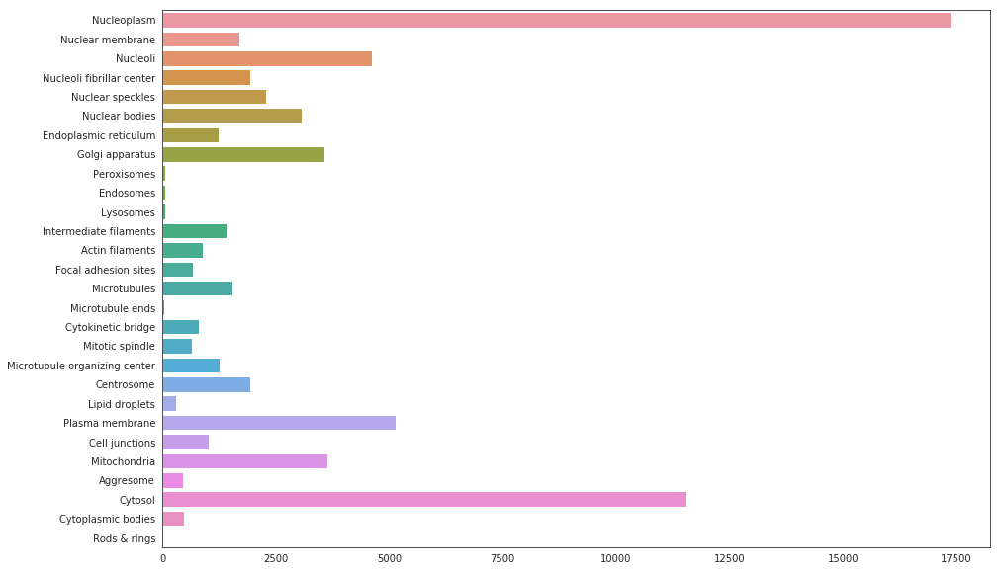

In [8]:
keys = list(config.appearance.keys())
values = np.array(list(config.appearance.values()))

plt.figure(figsize=(15, 10))
sns.barplot(y=keys, x=values);
plt.show()

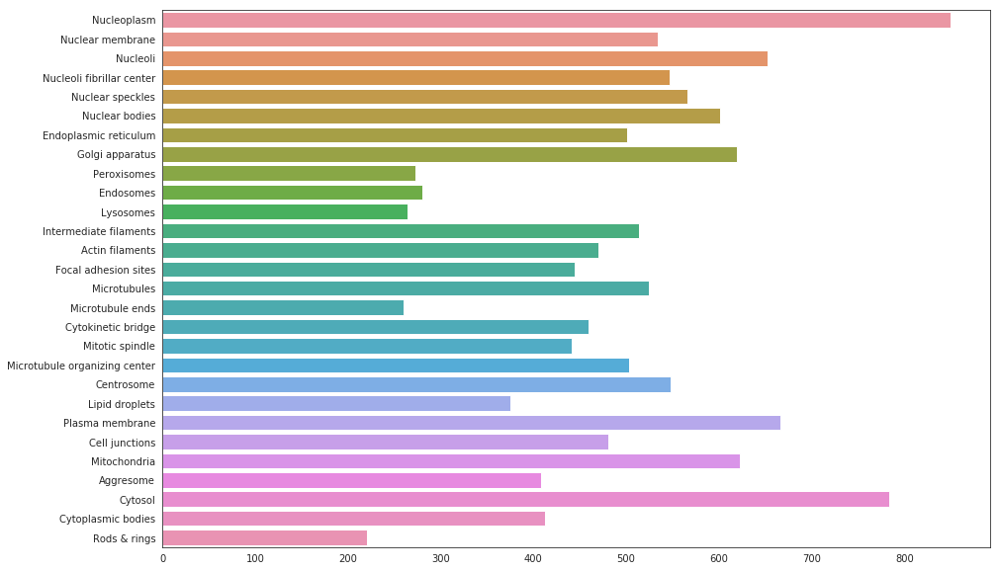

In [9]:
amounts = values * np.power(config.PARAMS['SUPPORT_CLASS_AMOUNT'] / values, config.PARAMS['SUPPORT_POWER'])
amounts = amounts.astype(np.int)

plt.figure(figsize=(15, 10))
sns.barplot(y=keys, x=amounts);
plt.show()

In [10]:
class FocalLoss(torch.nn.Module):
    def __init__(self, gamma=2):
        super().__init__()
        self.gamma = gamma
        
    def forward(self, input, target):
        if not (target.size() == input.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})"
                             .format(target.size(), input.size()))

        max_val = (-input).clamp(min=0)
        loss = input - input * target + max_val + \
            ((-max_val).exp() + (-input - max_val).exp()).log()

        invprobs = F.logsigmoid(-input * (target * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        
        return loss.sum(dim=1).mean()

In [11]:
import os


def create_dir(path):
    try:
        os.mkdir(path)
        print('Directory created: {}'.format(path))
    except:
        print('Directory exists: {}'.format(path))


def init_history(path):
        if os.path.isfile(path):
            return pickle.load(open(path, 'rb'))
        else:
            return defaultdict(list)


def format_predictions(results):
    predictions = np.concatenate([r['prediction'] for r in results])
#     predictions = torch.sigmoid(torch.tensor(predictions))
    labels = np.concatenate([r['label'] for r in results])
    loss = np.concatenate([r['loss'].reshape(1) for r in results])
    f1_score = measure_f1(predictions, labels)
    return {
        'predictions': predictions,
        'labels': labels,
        'loss': loss,
        'f1_score': f1_score,
    }

def prepare_data(datagen, nb_samples=PARAMS['NB_INFERS']):
    if isinstance(nb_samples, int):
        nb_samples = range(nb_samples)
    data = [datagen.dataset[i] for i in nb_samples]
    data = datagen.collate_fn(data)
    return data


def measure_f1(predictions, labels, threshs=.5):
    if isinstance(threshs, float):
        threshs = [threshs] * labels.shape[-1]
    return [
        sklearn.metrics.f1_score(labels[:, i], predictions[:, i] > threshs[i]) 
        for i, el in enumerate(label_names_list)
    ]


def format_history(history):
    return {
        key: [np.mean([el[key]]) for el in history] 
        for key in PARAMS['PLOT_KEYS']
    }


def plot_losses(formated_train, formated_valid):
    _, axes = plt.subplots(ncols=len(PARAMS['PLOT_KEYS']), figsize=(10 * len(PARAMS['PLOT_KEYS']), 6))

    for i, key in enumerate(PARAMS['PLOT_KEYS']):
        axes[i].plot(formated_valid[key], label='{} valid'.format(key), alpha=0.7, color='C{}'.format(i * 2))
        axes[i].plot(formated_train[key], label='{} trian'.format(key), alpha=0.7, color='C{}'.format(i * 2 + 1))

        axes[i].set_title(key)
        axes[i].legend()
        axes[i].grid()

    plt.show()

In [12]:
class Orchestrate:
    def __init__(self, learner, checkpoints_pth,
                 lr_scheduler=None,
                 fold=0, hard_negative_miner=None,
                 verbose=True, traced_key='loss', augmentations=None):
        self.learner = learner
        self.hard_negative_miner = hard_negative_miner
        self.verbose = verbose
        self.lr_scheduler = lr_scheduler
        self.traced_key = traced_key

        create_dir(checkpoints_pth)
        self.path = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_{}'.format(fold, '{}'))
        self.history = init_history(self.path.format('loss'))
        self.last_epoch = len(self.history['train_losses'])

        folds = ds.get_folds(PARAMS['NB_FOLDS'], PARAMS['SEED'])
        train_dataset, valid_dataset = ds.get_datasets(folds, fold, augmentations=augmentations)
        train_datagen, valid_datagen = ds.get_datagens(train_dataset, valid_dataset)
        self.train_datagen, self.valid_datagen = train_datagen, valid_datagen

    def __call__(self, nb_epochs=PARAMS['NB_EPOCHS']):
        for epoch_i in range(self.last_epoch, nb_epochs):
            if hasattr(self.lr_scheduler, 'step'):
                self.lr_scheduler.step()
            self.learner.freeze_encoder(unfreeze=(epoch_i >= PARAMS['NB_FREEZED_EPOCHS']))

            self.iteration(epoch_i)
            self.checkpoint(epoch_i, nb_epochs)

    def iteration(self, epoch_i):
        meters = self.learner.train_on_epoch(
            self.train_datagen, 
            hard_negative_miner=self.hard_negative_miner,
            lr_scheduler=self.lr_scheduler
        )
        meters = format_predictions(meters)
        self.history['train_losses'].append(meters)

        meters = self.learner.validate(self.valid_datagen)
        meters = format_predictions(meters)
        self.history['valid_losses'].append(meters)

        clear_output(wait=True)

    def checkpoint(self, epoch_i, nb_epochs):
        if self.verbose:
            plt.figure(figsize=(15,10))
            sns.barplot(y=label_names_list, x=self.history['valid_losses'][-1]['f1_score']);
            plt.show()
            
            formated_train = format_history(self.history['train_losses'])
            formated_valid = format_history(self.history['valid_losses'])
            plot_losses(formated_train, formated_valid)
            data = prepare_data(self.valid_datagen, PARAMS['NB_INFERS'])
            self.learner.infer_on_data(data)

        trace = formated_valid[self.traced_key]
        if trace[-1] >= max(trace):
            state_dict = self.learner.save(self.path.format('best'))
        if epoch_i == (nb_epochs - 1):
            state_dict = self.learner.save(self.path.format(epoch_i))

        pickle.dump(self.history, open(self.path.format('loss'), 'wb'))


# SIDE == 384

In [13]:
import re

model_urls = {
    'densenet121': 'https://download.pytorch.org/models/densenet121-a639ec97.pth',
    'densenet169': 'https://download.pytorch.org/models/densenet169-b2777c0a.pth',
    'densenet201': 'https://download.pytorch.org/models/densenet201-c1103571.pth',
    'densenet161': 'https://download.pytorch.org/models/densenet161-8d451a50.pth',
}

class DenseNet(models.DenseNet):
    def forward(self, x):
        features = self.features(x)
        out = torch.nn.functional.relu(features, inplace=True)
        out = torch.nn.functional.adaptive_avg_pool2d(out, (1, 1)).view(features.size(0), -1)
        out = self.classifier(out)
        return out


def densenet169(pretrained=False, **kwargs):
    r"""Densenet-169 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = DenseNet(num_init_features=64, growth_rate=32, block_config=(6, 12, 32, 32),
                     **kwargs)
    if pretrained:
        # '.'s are no longer allowed in module names, but pervious _DenseLayer
        # has keys 'norm.1', 'relu.1', 'conv.1', 'norm.2', 'relu.2', 'conv.2'.
        # They are also in the checkpoints in model_urls. This pattern is used
        # to find such keys.
        pattern = re.compile(
            r'^(.*denselayer\d+\.(?:norm|relu|conv))\.((?:[12])\.(?:weight|bias|running_mean|running_var))$')
        state_dict = torch.utils.model_zoo.load_url(model_urls['densenet169'])
        for key in list(state_dict.keys()):
            res = pattern.match(key)
            if res:
                new_key = res.group(1) + res.group(2)
                state_dict[new_key] = state_dict[key]
                del state_dict[key]
        model.load_state_dict(state_dict)
    return model

In [14]:
def set_io_dims(model, in_channels=4, out_channels=28, 
                pooling_type='avg', dropout=None):
    # Create input conv layer
    conv0 = model.features.conv0
    conv = torch.nn.Conv2d(
        in_channels, 
        conv0.out_channels, 
        kernel_size=conv0.kernel_size, 
        stride=conv0.stride, 
        padding=conv0.padding, 
        bias=conv0.bias is not None
    )
    weights = torch.cat([conv0.weight, conv0.weight[:, :1]], dim=1)
    conv.load_state_dict({ 'weight': weights })
    model.features.conv0 = conv

    # Create and reassign output linear layer
    model.classifier = torch.nn.Sequential(
        torch.nn.Dropout(dropout),
        torch.nn.Linear(
            model.classifier.in_features, 
            out_channels, 
            model.classifier.bias is not None
        )
    )

    return model

In [15]:
# # checkpoints_pth = '../data/models/densnet169_pure/'
# checkpoints_pth = '../data/models/resnet50_pseudo/'

# fold = 4

# model = models.resnet50(pretrained=True)
# model = lrn.set_io_dims(model, dropout=.5)

# # model = densenet169(pretrained=True)
# # model = set_io_dims(model, dropout=.5)

# checkpoint = None # os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold)) # None
# model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

# TODO: Augmentations with masks

In [16]:
loss = FocalLoss(gamma=2)
# loss = torch.nn.BCEWithLogitsLoss()

In [17]:
def get_features(model):
    # input_features = list()
    # middle_features = list()

    # for feature in model.module.features:
    #     if not isinstance(feature, InputBlock):
    #         middle_features.extend(feature.parameters())
    #     else:
    #         input_features.extend(feature.parameters())

    # input_features = list()
    # middle_features = list()
    features = model.module
    # features = model.module.features

    input_features = [
        features.conv1.parameters(),
        features.bn1.parameters(),
    #     features.conv0.parameters(),
    #     features.norm0.parameters(),
    #     features.pool0.parameters(),
    ]
    middle_features = [
        features.layer1.parameters(),
        features.layer2.parameters(),
        features.layer3.parameters(),
        features.layer4.parameters(),
    #     features.denseblock1.parameters(),
    #     features.denseblock2.parameters(),
    #     features.denseblock3.parameters(),
    #     features.transition1.parameters(),
    #     features.transition2.parameters(),
    #     features.transition3.parameters(),
    ]
    clf_features = [
        features.avgpool.parameters(),
        features.fc.parameters()
    #     features.norm5.parameters(),
    #     model.module.classifier.parameters()
    ]
    input_features = [param for feat in input_features for param in feat]
    middle_features = [param for feat in middle_features for param in feat]
    clf_features = [param for feat in clf_features for param in feat]
    return input_features, middle_features, clf_features

In [ ]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 4

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = None # os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

In [19]:
input_features, middle_features, clf_features = get_features(model)

In [20]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [21]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

[0.0002, 0.002, 0.02]

In [22]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

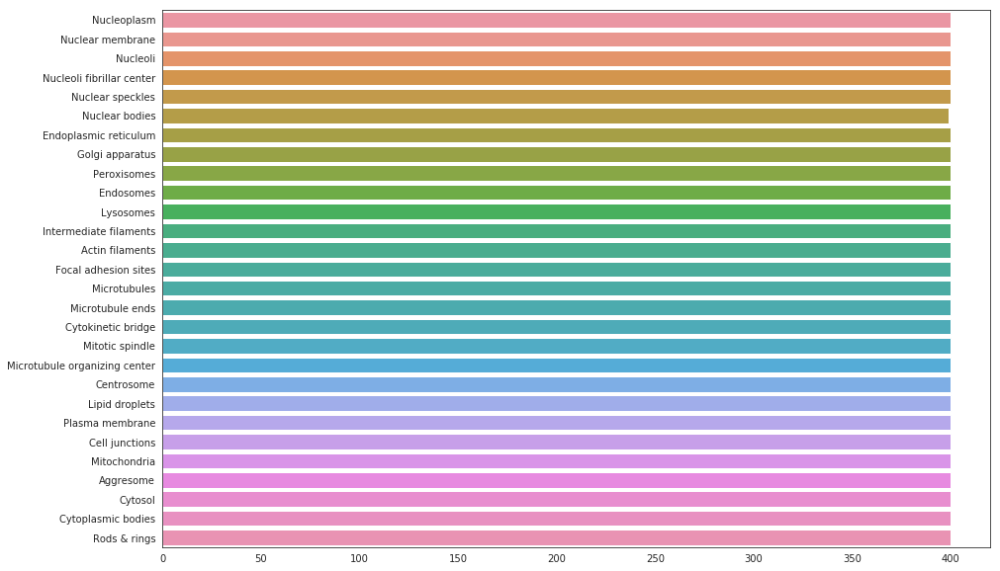

In [23]:
amounts = values * np.power(config.PARAMS['SUPPORT_CLASS_AMOUNT'] / values, config.PARAMS['SUPPORT_POWER'])
amounts = amounts.astype(np.int)

plt.figure(figsize=(15, 10))
sns.barplot(y=keys, x=amounts);
plt.show()

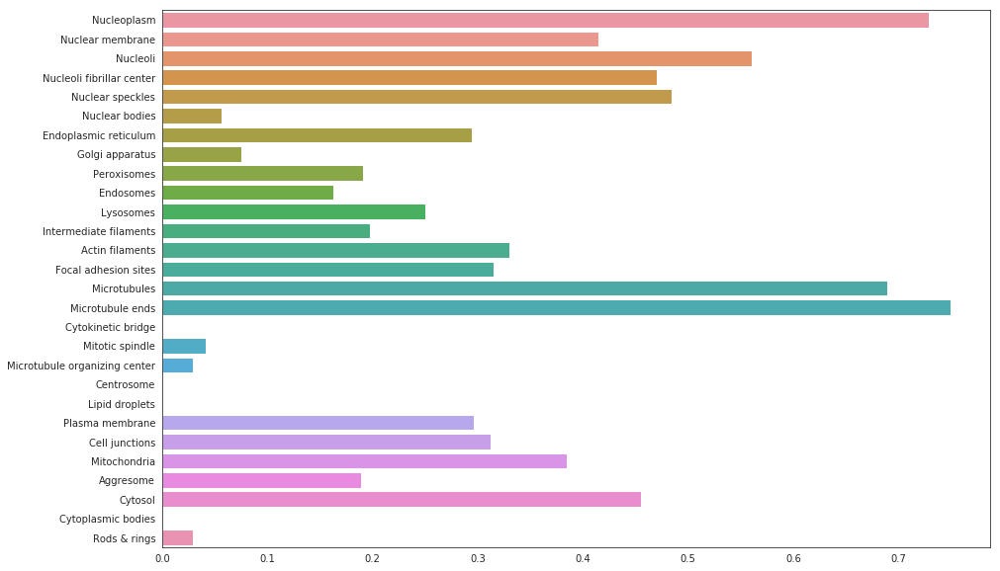

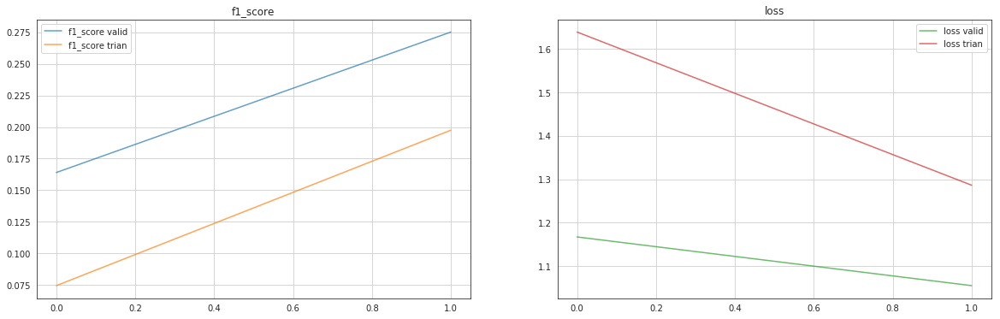

['Nuclear membrane'] [0.7297615]
['Nucleoplasm'] [0.65620863]
['Nucleoplasm', 'Nucleoli'] [0.371161   0.69115996]


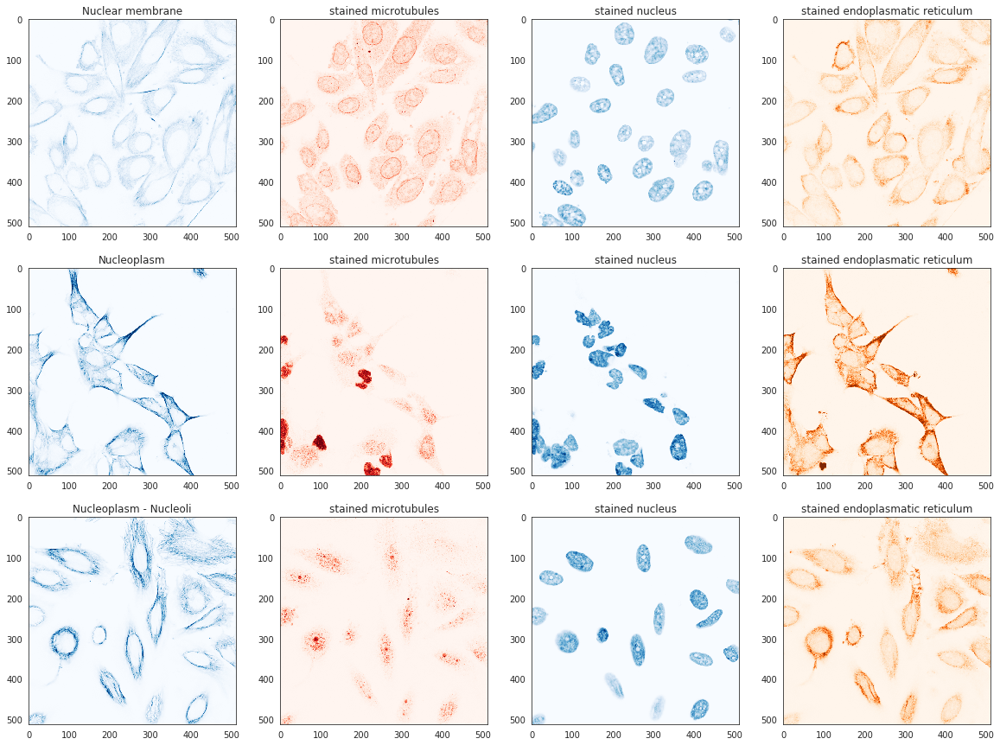

Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_best:
Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_1:


In [27]:
orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=None, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'])

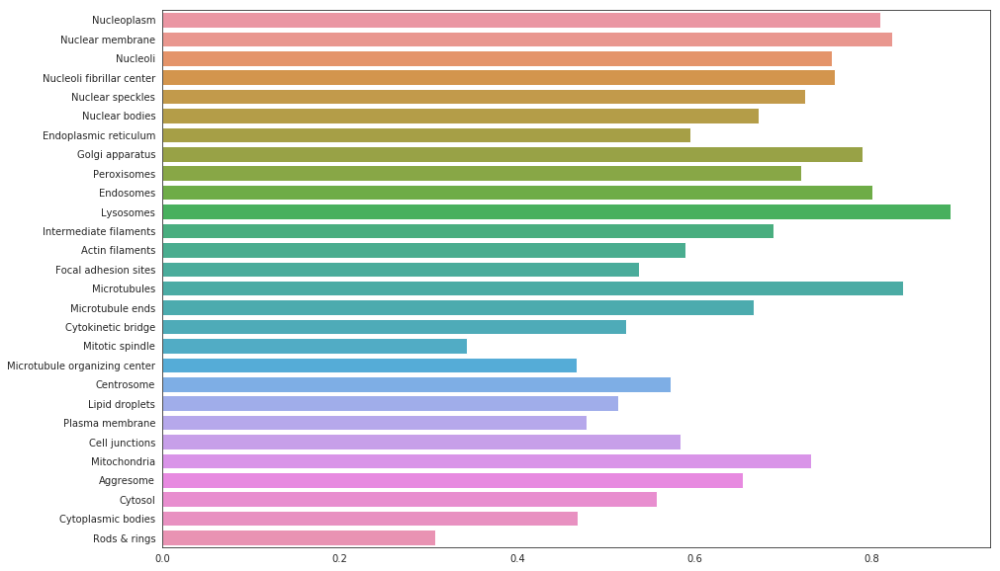

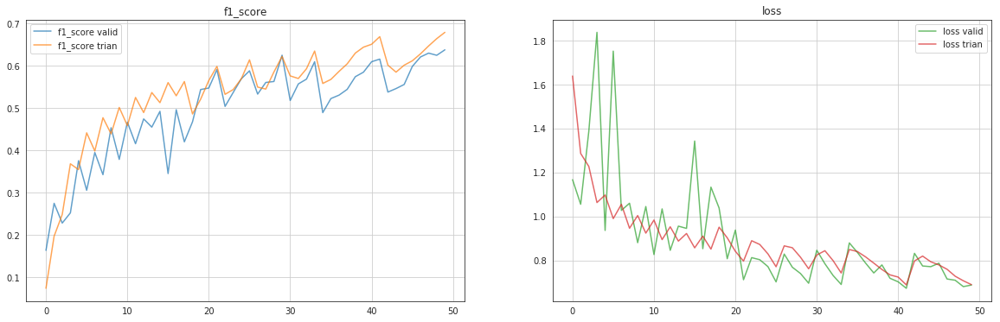

['Nuclear membrane'] [0.9555786]
['Nucleoplasm'] [0.66163146]
['Nucleoplasm', 'Nucleoli'] [0.51615614 0.8284318 ]


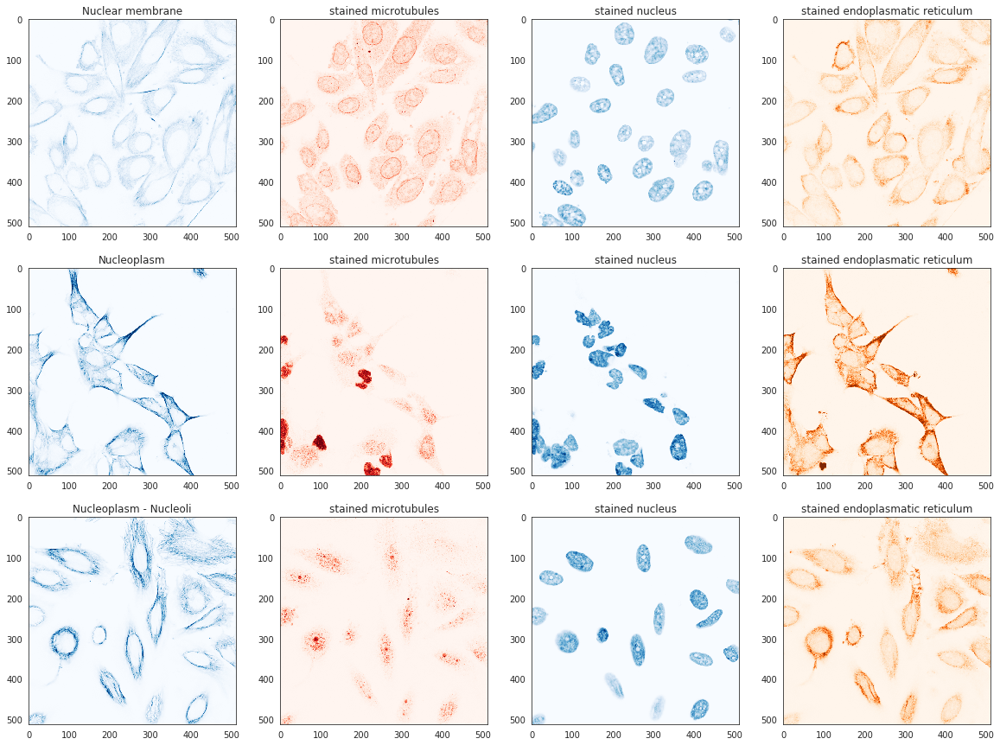

Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_best:
Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_49:


In [28]:
total_iterations = 261 # 480
config.PARAMS['SUPPORT_POWER'] = .9
config.PARAMS['BATCH_SIZE'] = 44 # 26

amounts = values * np.power(config.PARAMS['SUPPORT_CLASS_AMOUNT'] / values, config.PARAMS['SUPPORT_POWER'])
amounts = amounts.astype(np.int)

plt.figure(figsize=(15, 10))
sns.barplot(y=keys, x=amounts);
plt.show()

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ / 4
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=2 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 16)

total_iterations = 290 # 550
config.PARAMS['SUPPORT_POWER'] = .8

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ / 4
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=4 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 32)


for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ / 4
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=8 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 48)

In [29]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

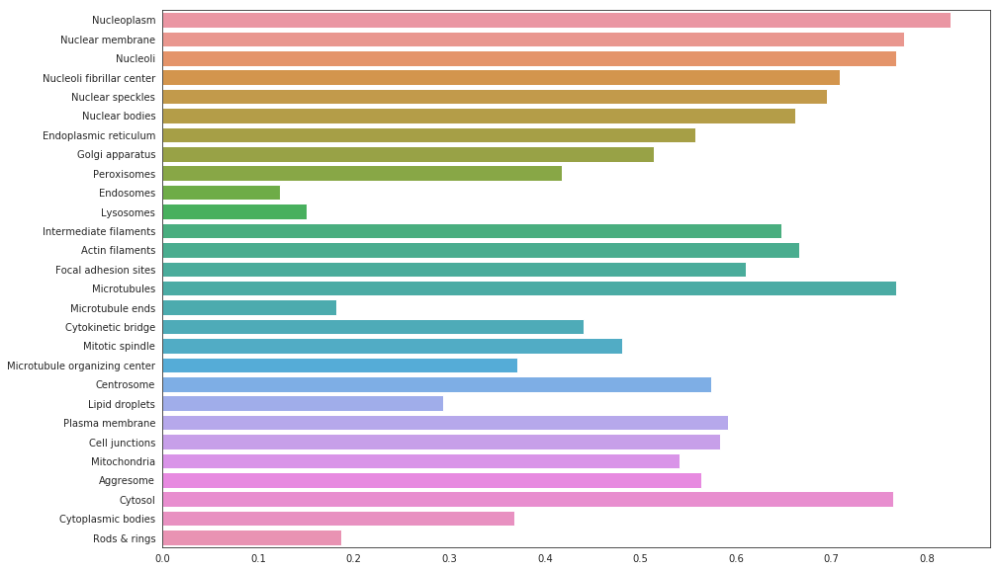

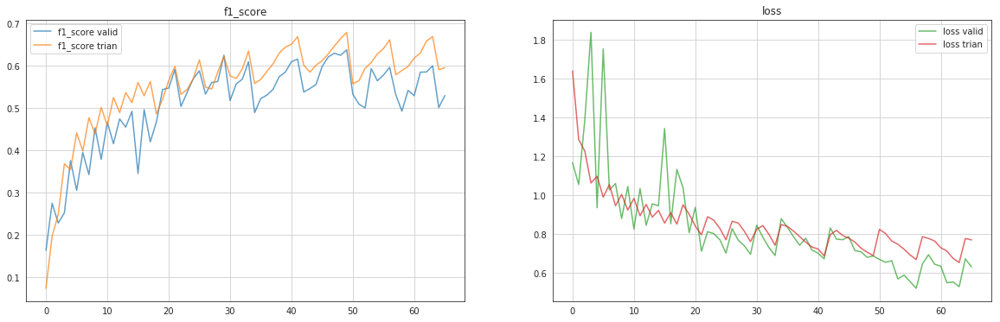

['Nuclear membrane'] [0.9067201]
['Nucleoplasm'] [0.7163295]
['Intermediate filaments'] [0.7397252]


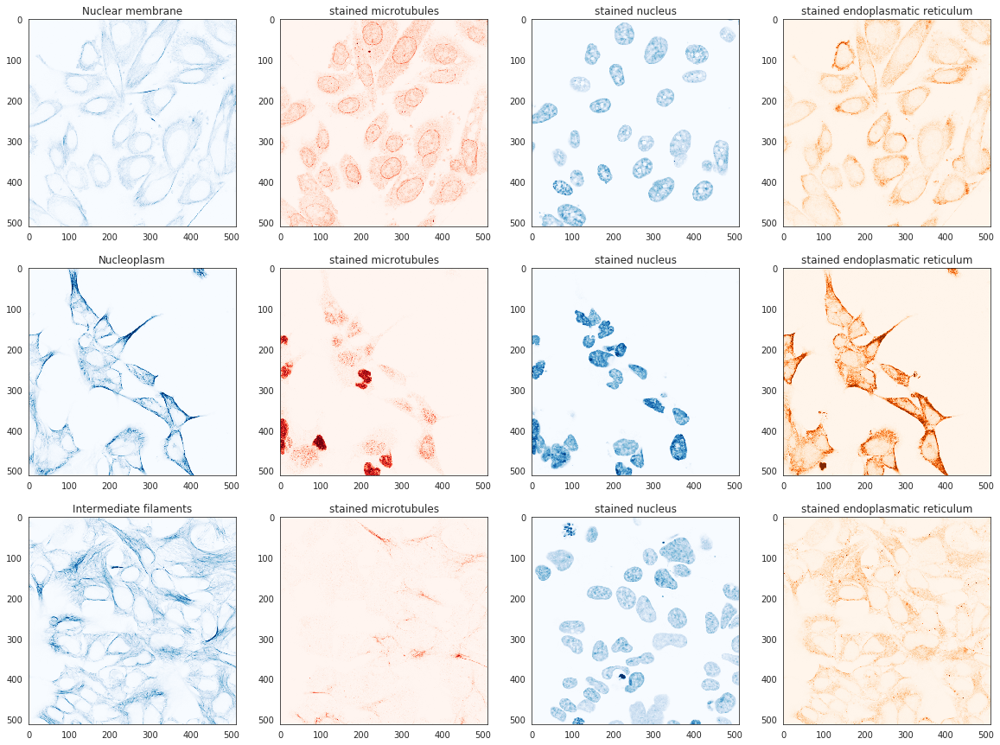

Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_65:


In [30]:
config.PARAMS['SUPPORT_POWER'] = .8
for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ / 4
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=8 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 64)

In [ ]:
config.PARAMS['BATCH_SIZE'] = 44 # 26
config.PARAMS['SUPPORT_POWER'] = .7
for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .25 * .8
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=8 * total_iterations,
    coeff = .95
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 80)

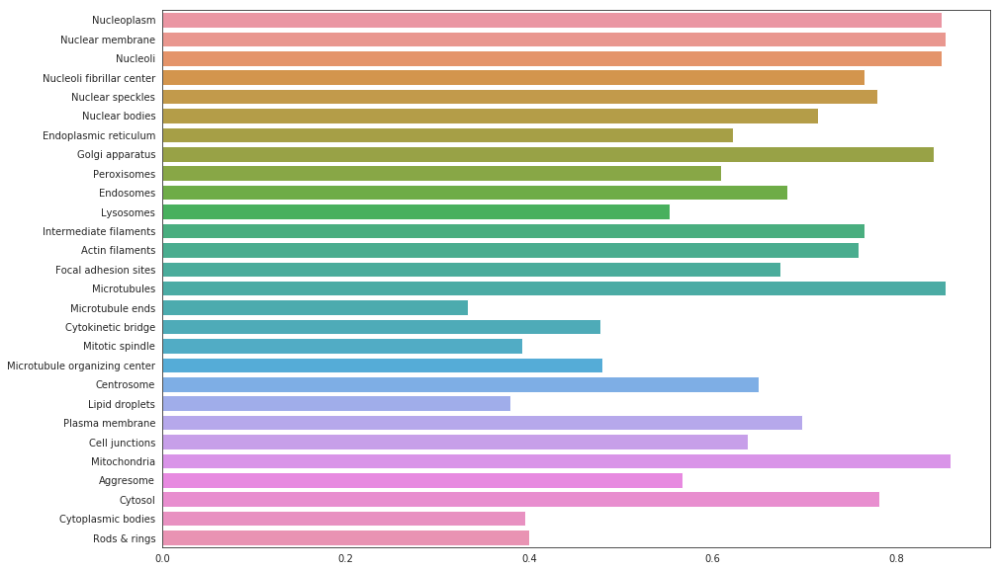

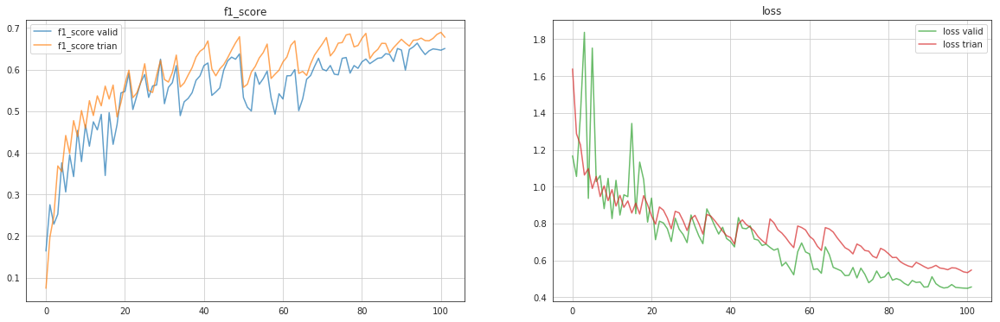

['Nuclear membrane'] [0.95519984]
['Nucleoplasm'] [0.71265364]
['Intermediate filaments'] [0.96207875]


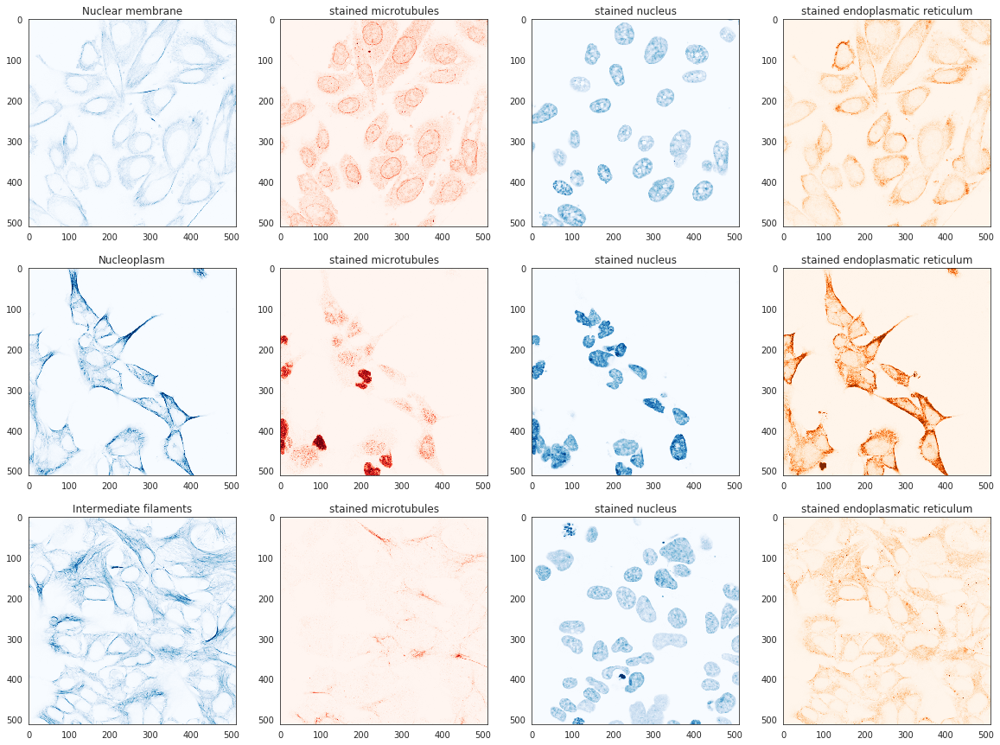

Saved in ../data/models/resnet50_pseudo/fold_4_checkpoint.epoch_101:


In [32]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 550 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 34 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .08
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=8 * total_iterations,
    coeff = .95
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 100)

In [ ]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 550 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 34 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.PiloExt(
    opt, multiplier=.1,
    steps_per_epoch=8 * total_iterations,
    coeff = .95
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 100)

In [18]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 0

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

Overlapped keys: 320


In [19]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [20]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [21]:
input_features, middle_features, clf_features = get_features(model)

In [22]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

[0.0002, 0.002, 0.02]

In [23]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

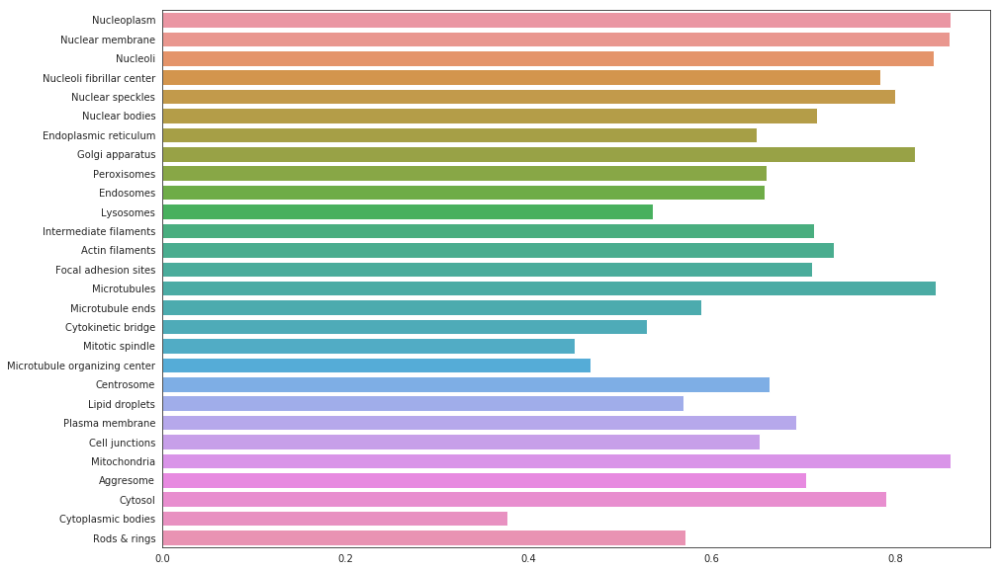

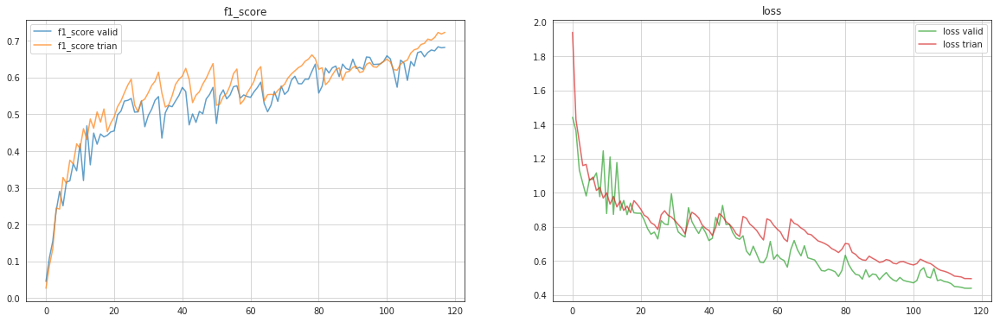

['Nucleoplasm'] [0.877521]
['Plasma membrane'] [0.70923615]
['Nucleoplasm', 'Aggresome'] [0.7467405 0.3824496]


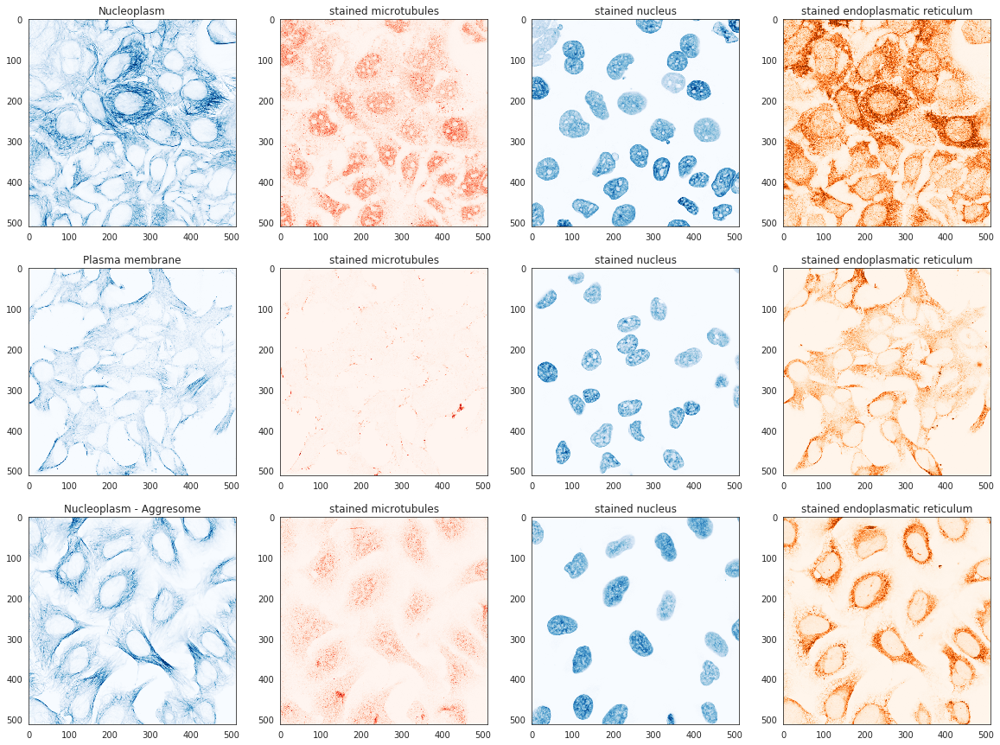

Saved in ../data/models/resnet50_pseudo/fold_0_checkpoint.epoch_117:


In [25]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 872 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 36 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=16 * total_iterations,
    coeff = .95
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 116)

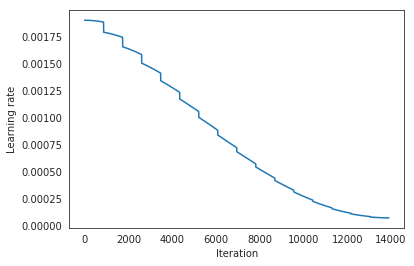

In [26]:
lr_scheduler.plot_lr()

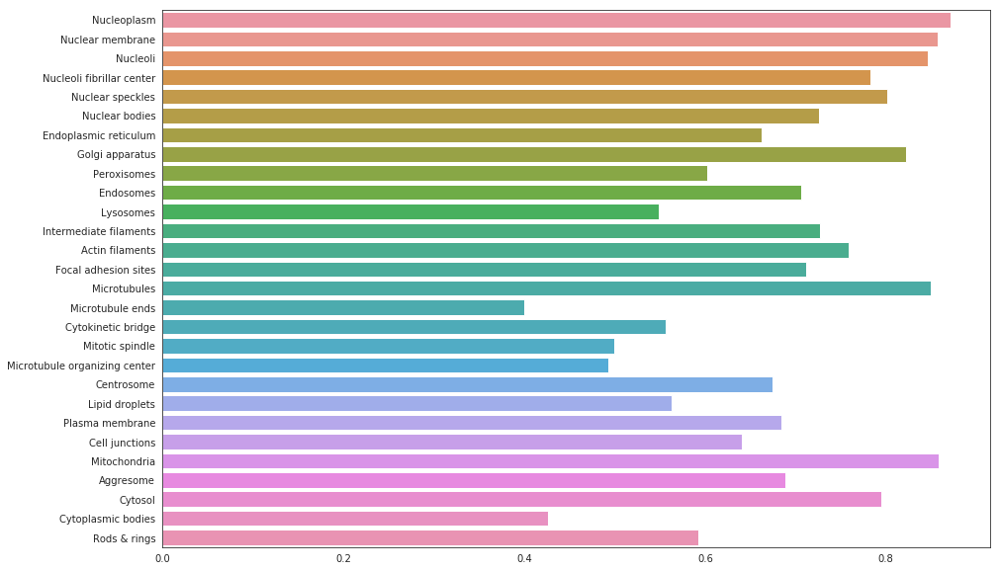

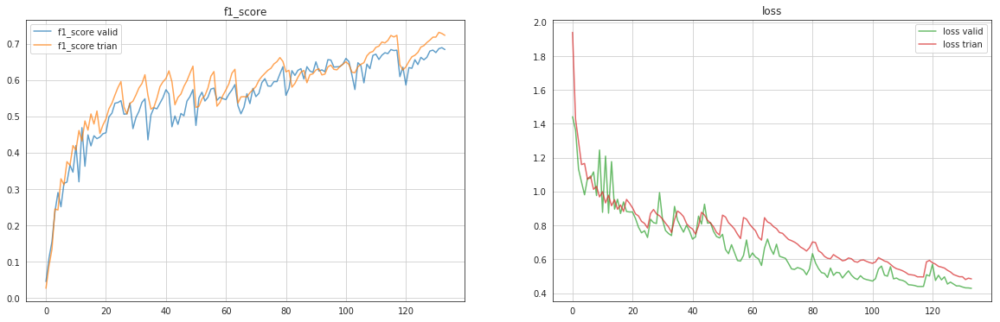

['Nucleoplasm'] [0.8693091]
['Plasma membrane'] [0.7243783]
['Nucleoplasm', 'Aggresome'] [0.7109767  0.48022056]


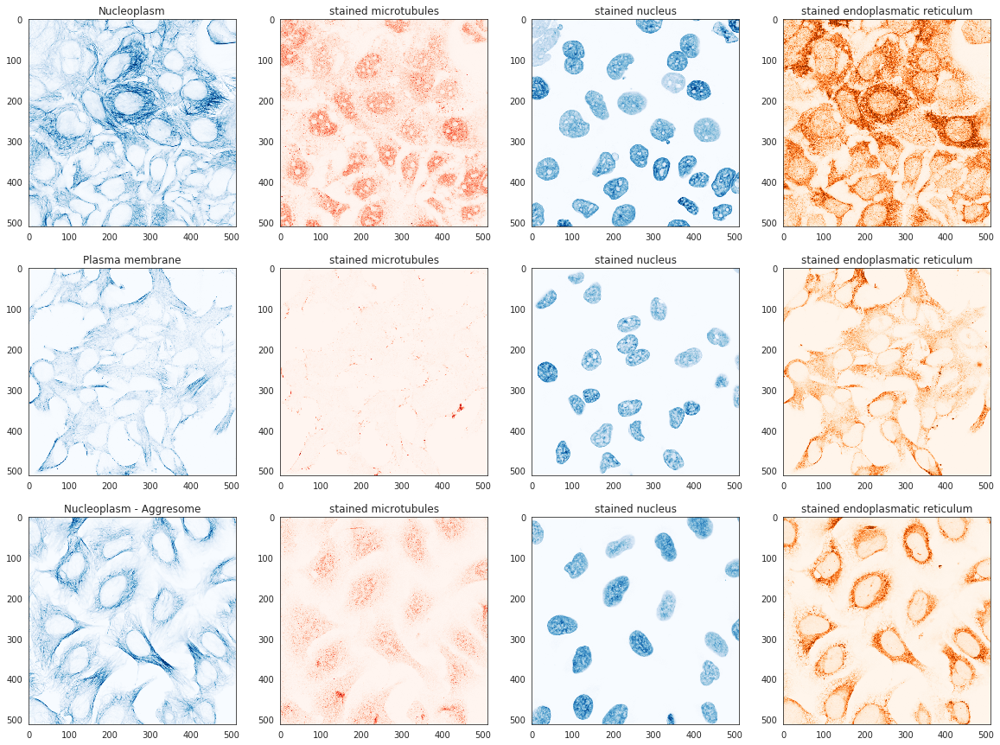

Saved in ../data/models/resnet50_pseudo/fold_0_checkpoint.epoch_133:


In [27]:
for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=16 * total_iterations,
    coeff = .95
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 132)

In [28]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 1

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

Overlapped keys: 320


In [29]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [30]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [31]:
input_features, middle_features, clf_features = get_features(model)

In [32]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

[0.0002, 0.002, 0.02]

In [33]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

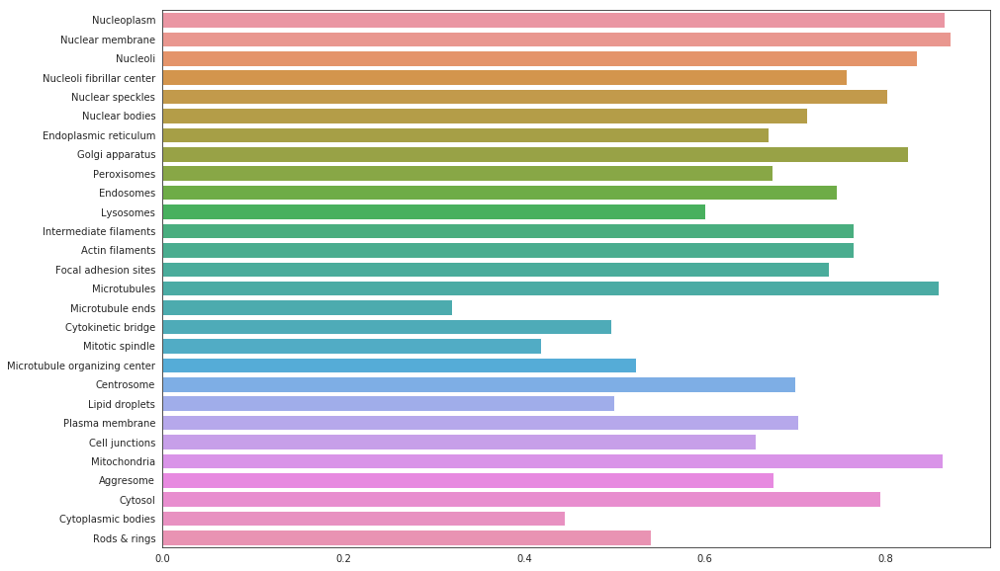

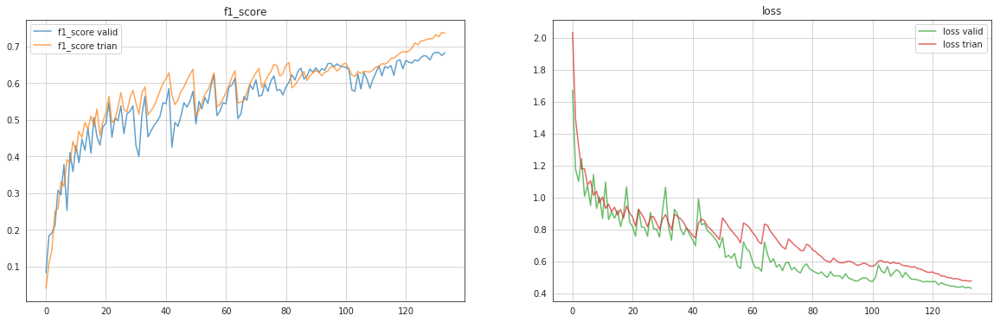

['Nuclear bodies'] [0.7886289]
['Mitochondria'] [0.4677936]
['Focal adhesion sites'] [0.9920244]


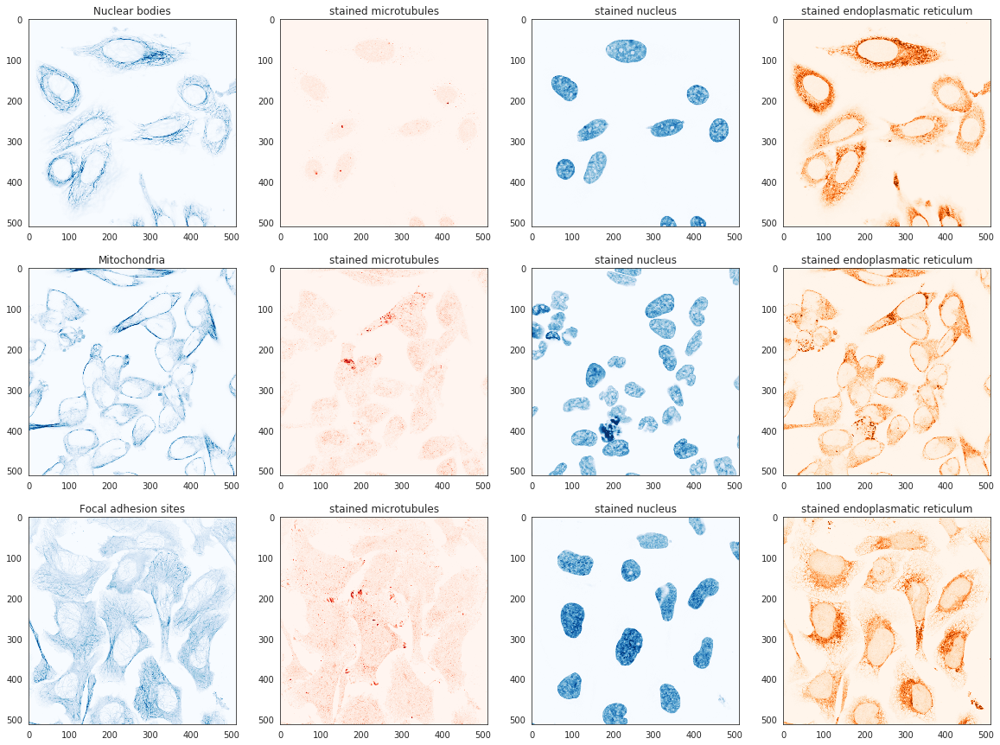

Saved in ../data/models/resnet50_pseudo/fold_1_checkpoint.epoch_133:


In [34]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 872 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 36 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=32 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 132)

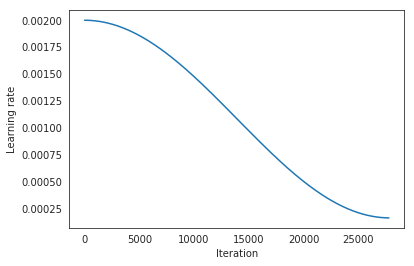

In [35]:
lr_scheduler.plot_lr()

In [36]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 2

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

Overlapped keys: 320


In [37]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [38]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [39]:
input_features, middle_features, clf_features = get_features(model)

In [40]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

[0.0002, 0.002, 0.02]

In [41]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

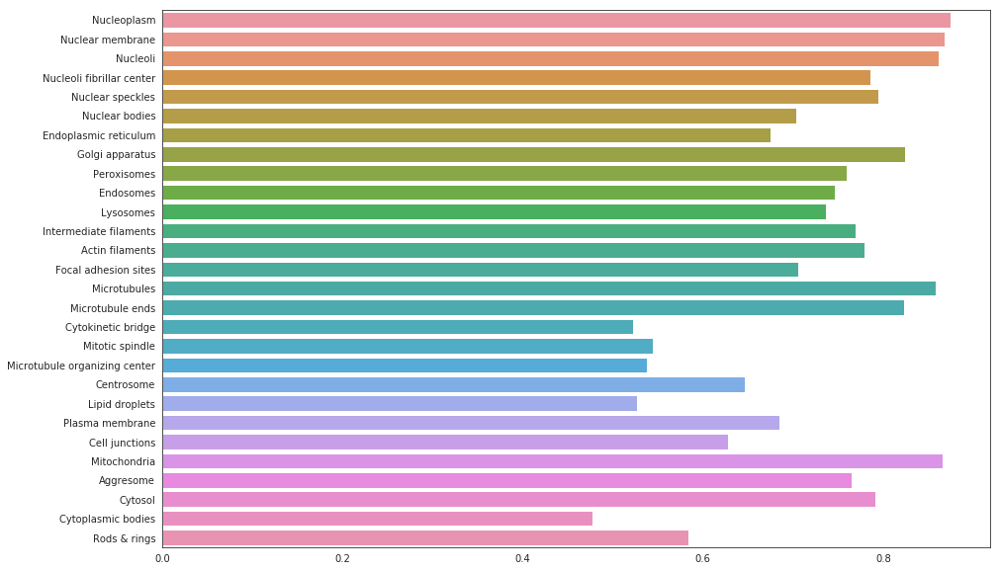

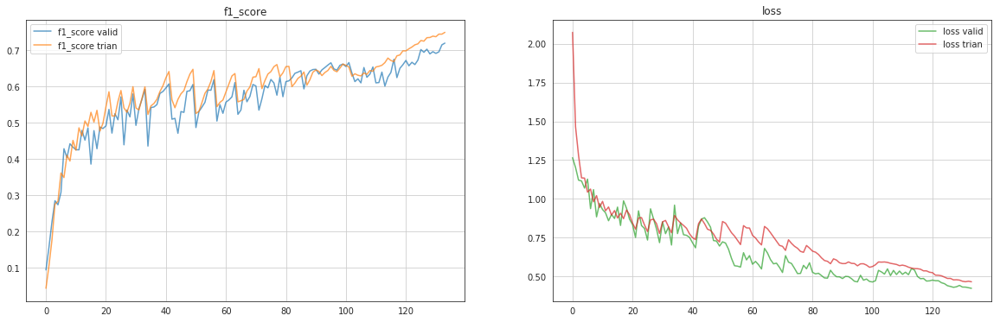

['Nucleoplasm', 'Cytokinetic bridge'] [0.9042783 0.8353974]
['Microtubule organizing center'] [0.9599435]
['Nucleoli', 'Cytosol'] [0.93733674 0.66374177]


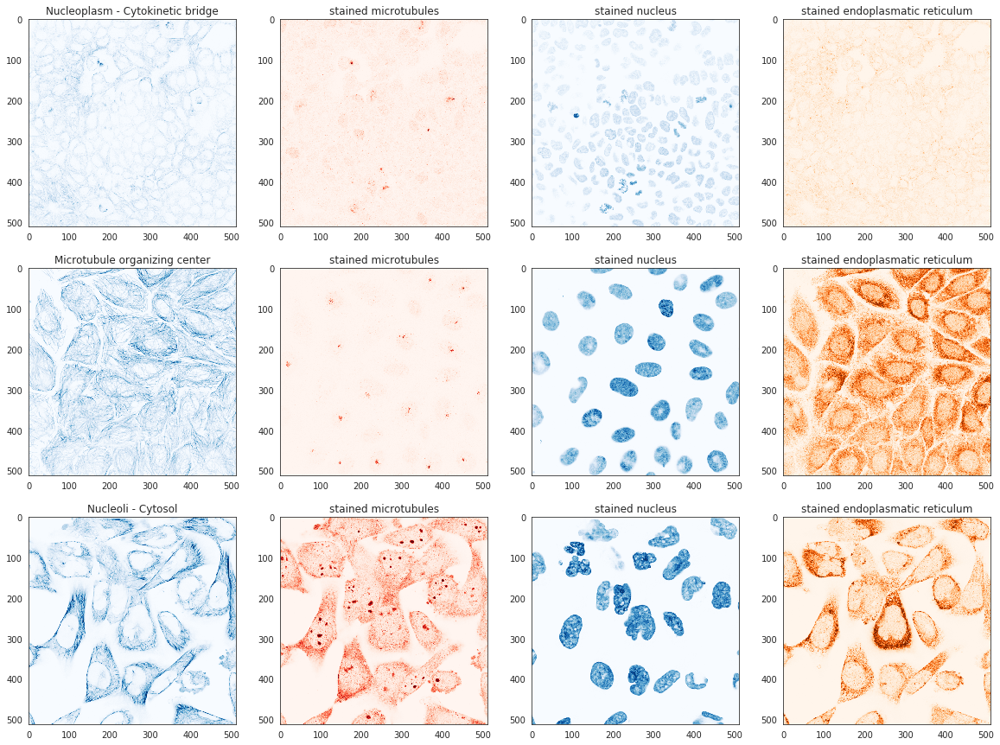

Saved in ../data/models/resnet50_pseudo/fold_2_checkpoint.epoch_best:
Saved in ../data/models/resnet50_pseudo/fold_2_checkpoint.epoch_133:


In [42]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 872 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 36 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=32 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 132)

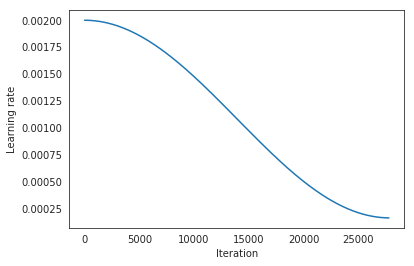

In [43]:
lr_scheduler.plot_lr()

In [44]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 3

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

Overlapped keys: 320


In [45]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [46]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [47]:
input_features, middle_features, clf_features = get_features(model)

In [48]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

[0.0002, 0.002, 0.02]

In [49]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

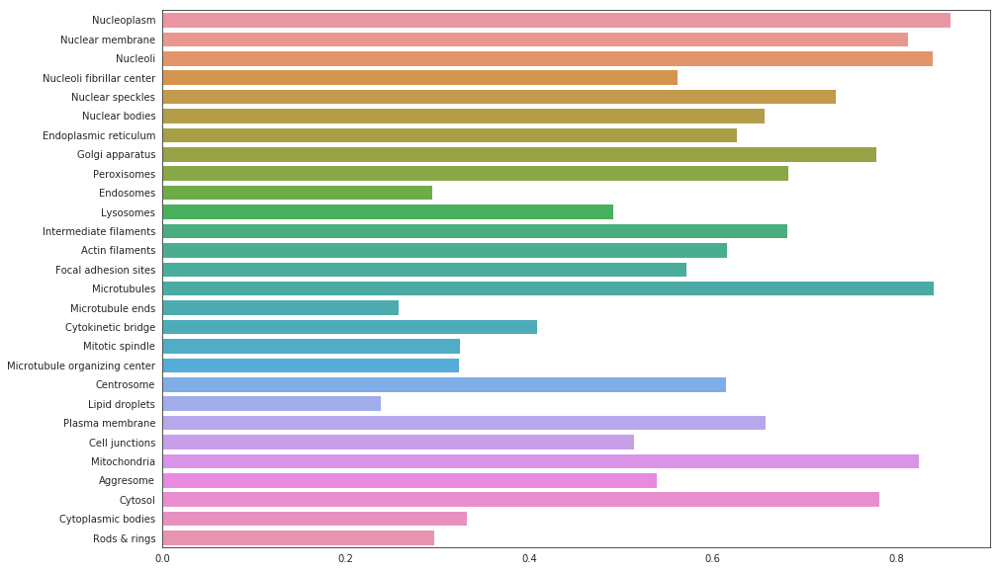

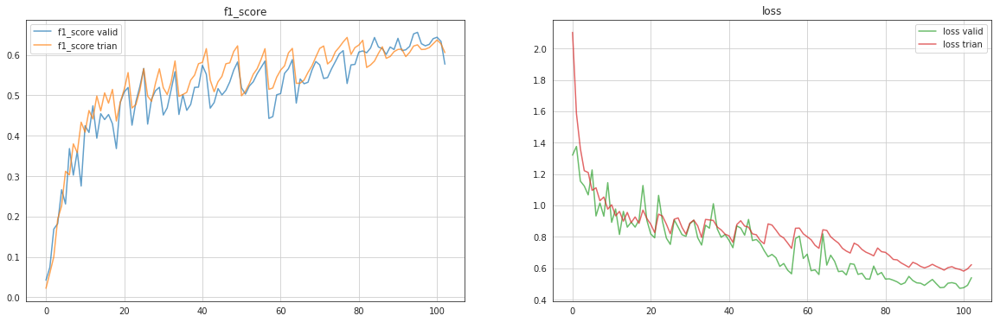

['Nucleoplasm', 'Nuclear membrane', 'Nucleoli', 'Golgi apparatus'] [0.3033468  0.9867562  0.20530367 0.26419097]
['Nucleoplasm', 'Nucleoli'] [0.42402706 0.93967557]
['Mitochondria'] [0.8117825]


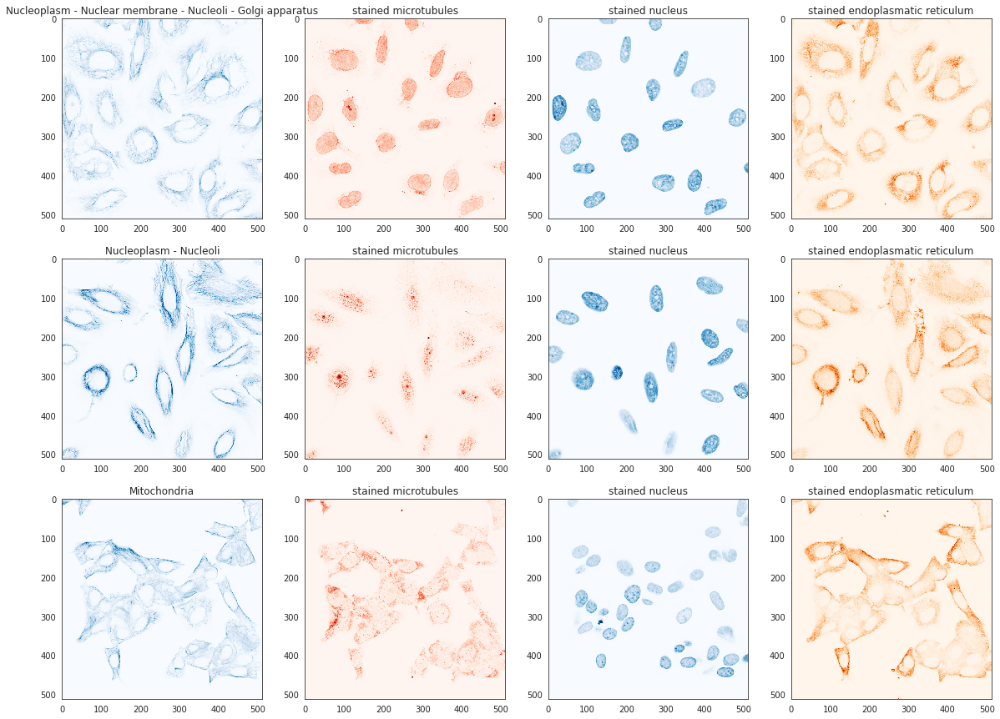

 24%|██▍       | 207/869 [02:16<07:16,  1.52it/s]

In [ ]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 872 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 36 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=32 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 132)

In [ ]:
lr_scheduler.plot_lr()

In [ ]:
checkpoints_pth = '../data/models/resnet50_pseudo/'
fold = 4

model = models.resnet50(pretrained=True)
model = lrn.set_io_dims(model, dropout=.5)

checkpoint = os.path.join(checkpoints_pth, 'fold_{}_checkpoint.epoch_best'.format(fold))
model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])

In [ ]:
config.labels = config.labels[config.labels.Type.isin([0, 2])]

In [ ]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [ ]:
input_features, middle_features, clf_features = get_features(model)

In [ ]:
augmentations = augs.Augmentation(side=480, simplex_noise=False, simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 44 // 2

total_iterations = 620

lr = 2e-2
lrs = [lr / 100, lr / 10, lr]
lrs

In [ ]:
config.PARAMS['SUPPORT_POWER'] = 1.

opt = torch.optim.Adam([
        { 'params': input_features, 'lr': lrs[0] },
        { 'params': middle_features, 'lr': lrs[1] },
        { 'params': clf_features, 'lr': lrs[2] }
    ],
    lr=1e-3, weight_decay=1e-4
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

In [ ]:
augmentations = augs.Augmentation(side=None, simplex_noise=False, simplex_vanishing=True)
total_iterations = 872 # 1580
config.PARAMS['SUPPORT_POWER'] = .4
config.PARAMS['BATCH_SIZE'] = 36 # 22

for param_group, lr_ in zip(opt.param_groups, lrs):
    param_group['lr'] = lr_ * .1
    print(param_group['lr'])

lr_scheduler = lrf.CosinePiloExt(
    opt, multiplier=.08,
    steps_per_epoch=32 * total_iterations,
    coeff = 1.
)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=config.PARAMS['NB_FREEZED_EPOCHS'] + 132)

In [ ]:
lr_scheduler.plot_lr()

In [ ]:
checkpoints_pth = '../data/models/wider_resnet_side_512/'
fold = 1

model = WiderResNet(structure=[3, 3, 6, 3, 1, 1], classes=28, norm_act=InPlaceABN, input_channels=4)
# model = lrn.set_io_dims_densnet(model, in_channels=4, out_channels=28, dropout=PARAMS['DROPOUT'])
model = lrn.get_model(model, checkpoint='../data/models/wider_resnet_side_512/fold_1_checkpoint.epoch_24', devices=PARAMS['CUDA_DEVICES'])

opt = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

augmentations = augs.Augmentation(side=448, simplex_noise=config.PARAMS['SIMPLEX_NOISE'], simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 32

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=None, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=25)

for param_group in opt.param_groups:
    param_group['lr'] = 1e-4
    param_group['initial_lr'] = 1e-4

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=None, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)

orchestrater(nb_epochs=35)

lr_scheduler = lrf.Pilo(
    opt, min_lr=5e-6, max_lr=1e-5,
    coeff=.95, steps_per_epoch=200,
)

augmentations = augs.Augmentation(side=None, simplex_noise=config.PARAMS['SIMPLEX_NOISE'], simplex_vanishing=True)
config.PARAMS['BATCH_SIZE'] = 26

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=None, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)

orchestrater(nb_epochs=65)

In [ ]:
checkpoints_pth = '../data/models/resnet101_side_768'
fold = 0

model = models.resnet101(pretrained=True)
model = lrn.set_io_dims(model, in_channels=4, out_channels=28, dropout=PARAMS['DROPOUT'])
model = lrn.get_model(model, checkpoint='../data/models/resnet101_side_384_pilo/fold_{}_checkpoint.epoch_49'.format(fold), devices=PARAMS['CUDA_DEVICES'])

opt = torch.optim.Adam(model.parameters(), lr=4e-4, weight_decay=1e-4)
lr_scheduler = lrf.Pilo(
    opt, min_lr=5e-6, max_lr=1e-5, 
    coeff=.95, steps_per_epoch=1500, 
)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=PARAMS['NB_EPOCHS'])

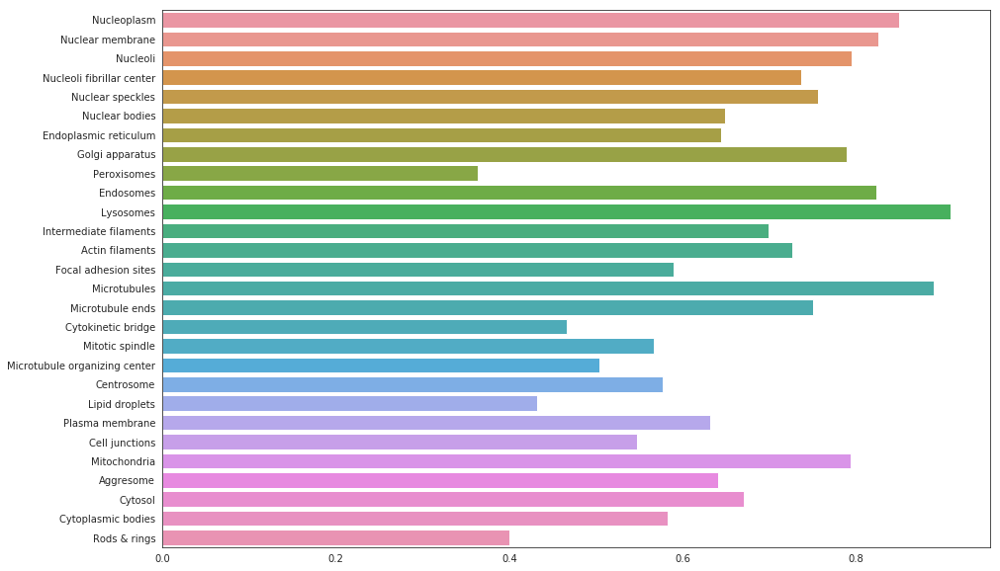

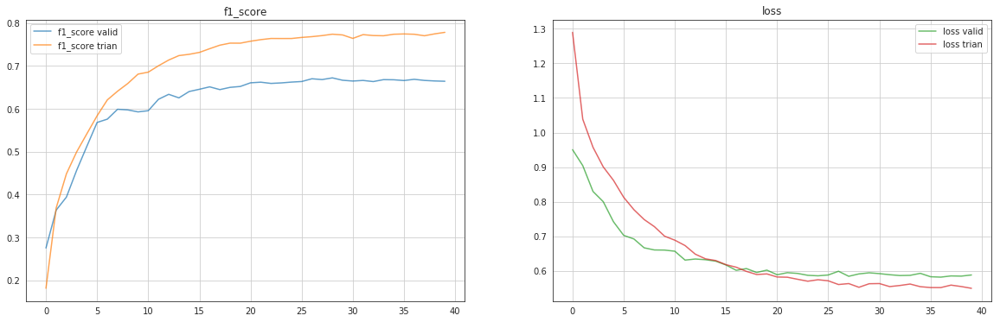

['Nucleoplasm', 'Cytokinetic bridge'] [0.6219584 0.7728585]
['Cytosol'] [0.6919971]
['Focal adhesion sites'] [0.7257887]


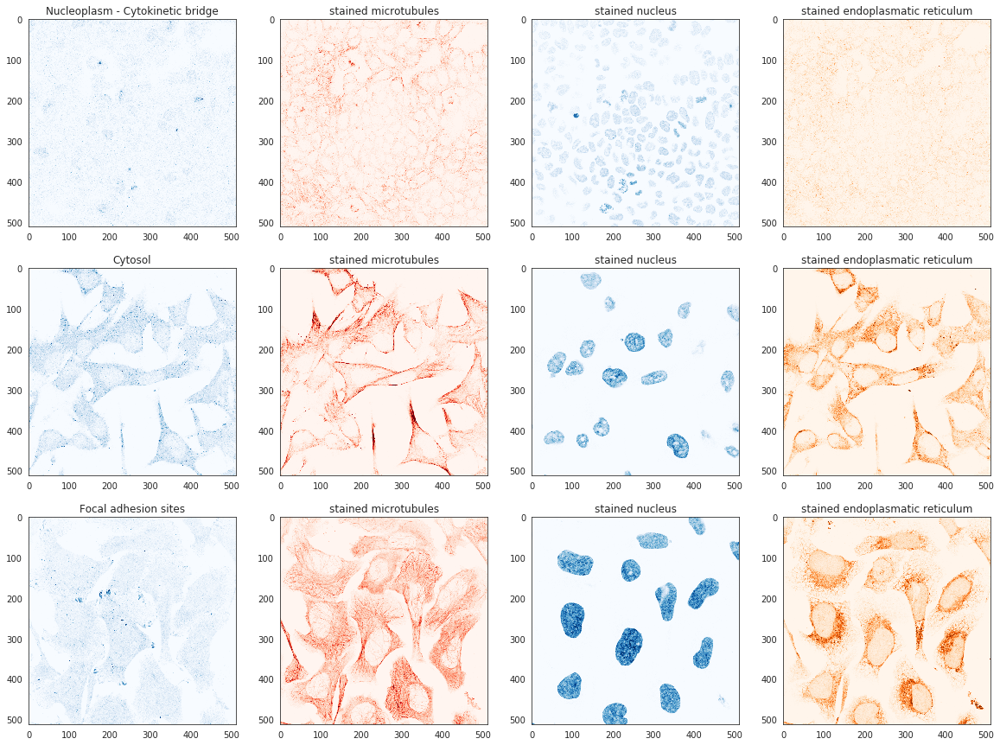

Saved in ../data/models/resnet101_side_384/fold_0_checkpoint.epoch_39:


In [15]:
checkpoints_pth = '../data/models/resnet101_side_384'
fold = 0

model = models.resnet101(pretrained=True)
model = lrn.set_io_dims(model, in_channels=4, out_channels=28, dropout=PARAMS['DROPOUT'])
model = lrn.get_model(model, checkpoint=None, devices=PARAMS['CUDA_DEVICES'])

opt = torch.optim.Adam(model.parameters(), lr=4e-4, weight_decay=1e-4)
lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(opt, gamma=PARAMS['EXP_GAMMA'], last_epoch=-1)
learner = lrn.Learner(model=model, opt=opt, loss=loss)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=PARAMS['NB_FREEZED_EPOCHS'])

for param_group in opt.param_groups:
    param_group['lr'] = 5e-5
    param_group['initial_lr'] = 5e-5
lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(opt, gamma=PARAMS['EXP_GAMMA'], last_epoch=-1)

orchestrater = Orchestrate(
    learner, checkpoints_pth=checkpoints_pth, fold=fold, lr_scheduler=lr_scheduler, 
    hard_negative_miner=None, verbose=True, traced_key='f1_score', 
    augmentations=augmentations
)
orchestrater(nb_epochs=PARAMS['NB_EPOCHS'])

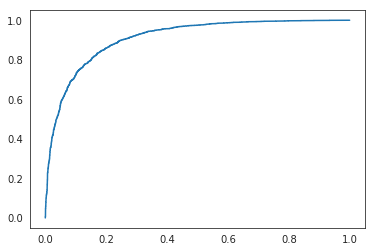

In [18]:
roc_curve = sklearn.metrics.roc_curve(orchestrater.history['valid_losses'][-1]['labels'][:, i], orchestrater.history['valid_losses'][-1]['predictions'][:, i])
plt.plot(roc_curve[0], roc_curve[1])

# Inference

In [28]:
test_df = pd.read_csv(os.path.join(config.PATHS['CSV'], 'sample_submission.csv'))
for name in config.label_names_list + ['Predicted', 'Target']:
    test_df[name] = 0

In [19]:
elabels = pd.read_csv(config.external_csv)
elabels['Type'] = 1
elabels['Target'] = elabels.Target.apply(lambda x: np.array(x.split(' ')).astype(np.int))

config.labels = pd.concat([config.labels[config.labels.Type.isin([0, 2])], elabels])
config.labels.reset_index(drop=True, inplace=True)

In [20]:
class FakeFC(torch.nn.Linear):
    def forward(self, input):
        if self.training: return F.linear(input, self.weight, self.bias)
        else: return input



In [21]:
def prepare_learner(fold, checkpoint, fake_fc=False):
#     model = densenet121(pretrained=True)
#     model = lrn.set_io_dims_densnet(model, in_channels=4, out_channels=28, dropout=PARAMS['DROPOUT'])
    model = models.resnet50(pretrained=True)
    model = lrn.set_io_dims(model, dropout=.5)

    if fake_fc:
        fc = model.fc
        fake_fc = FakeFC(fc.in_features, fc.out_features, bias=fc.bias is not None)
        fake_fc.load_state_dict(fc.state_dict())
        model.fc = fake_fc

    model = lrn.get_model(model, checkpoint=checkpoint, devices=PARAMS['CUDA_DEVICES'])
    model.module.eval()

    learner = lrn.Learner(model=model, opt=None, loss=None)
    return learner

def prepare_data(fold):
    folds = ds.get_folds(config.PARAMS['NB_FOLDS'])
    _, valid_dataset = ds.get_datasets(folds, fold)

    test_dataset = ds.ProteinDataset(
        test_df,
        config.PATHS['TEST'], 
        config.label_names_list, 
        augmentations=None
    )
    return valid_dataset, test_dataset


In [22]:
def infer(model, idx, data, predicts, labels=None, fake_fc=False):
    with torch.no_grad():
        image = data['image'].unsqueeze(0)
        if config.PARAMS['SIDE'] is not None:
            image = augs.get_crops(image, config.PARAMS['SIDE'])
        image = augs._rotate_mirror_do(image)

        image = torch.tensor(image)
        image = torch.autograd.Variable(image).cuda()
        predict = model(image)
        if not fake_fc:
            predict = torch.sigmoid(predict)
        predict = predict.reshape(8, -1)
        predicts[idx] = predict.mean(0).data.cpu().numpy()

        image = image.data.cpu()
        if labels is not None:
            labels[idx] = data['label']


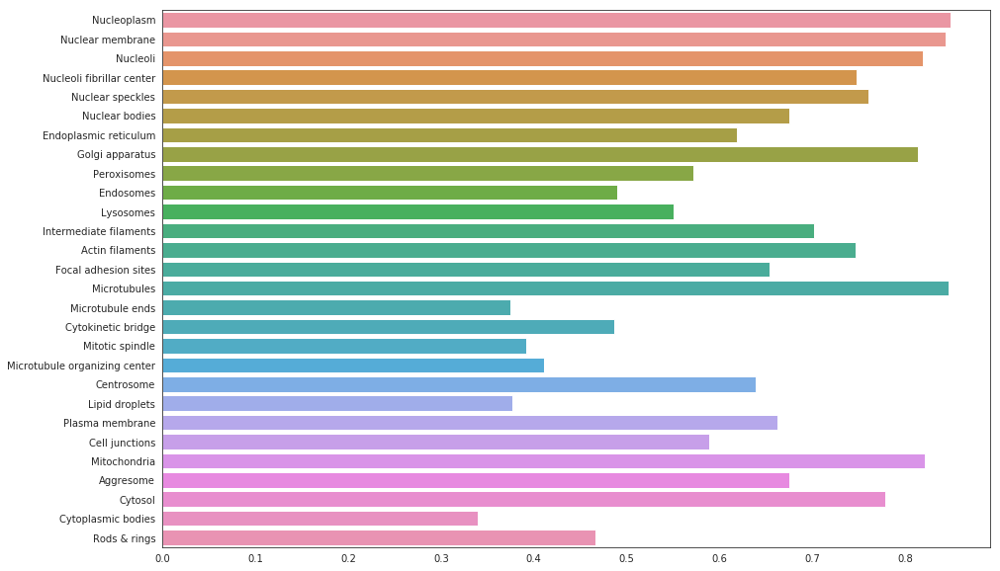

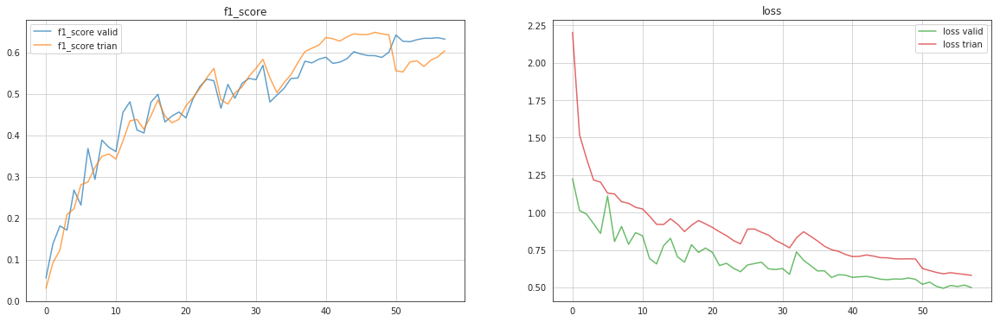

In [23]:
history = pickle.load(open('../data/models/resnet50_pure/fold_0_checkpoint.epoch_loss', 'rb'))
plt.figure(figsize=(15,10))
sns.barplot(y=label_names_list, x=history['valid_losses'][-1]['f1_score']);
plt.show()

formated_train = format_history(history['train_losses'])
formated_valid = format_history(history['valid_losses'])
plot_losses(formated_train, formated_valid)


In [24]:
def orchestrate_inference(fold, checkpoints_pth, epoch, fake_fc=False):
    template_path = 'fold_{}_checkpoint.epoch_{}'
    path = os.path.join(checkpoints_pth, template_path)
    dump_path = os.path.join(checkpoints_pth, '{}_fold_{}')
    
    history = pickle.load(open(path.format(fold, 'loss'), 'rb'))
    plt.figure(figsize=(15,10))
    sns.barplot(
        y=label_names_list, 
        x=history['valid_losses'][epoch if isinstance(epoch, int) else -1]['f1_score']
    );
    plt.show()

    formated_train = format_history(history['train_losses'])
    formated_valid = format_history(history['valid_losses'])
    plot_losses(formated_train, formated_valid)
    
    learner = prepare_learner(fold, path.format(fold, epoch), fake_fc=fake_fc)
    valid_dataset, test_dataset = prepare_data(fold)
    

    predicts = np.zeros(shape=(
        len(test_dataset), 
        learner.model.module.fc.in_features if fake_fc else len(config.label_names_list)
    ))
# #     try:
    for idx in tqdm(range(len(test_dataset))):
        infer(learner.model, idx, test_dataset[idx], predicts, labels=None, fake_fc=fake_fc)
# #     except Exception as e:
# #         print(e)
# #         print('idx: {}'.format(idx))
    np.save(dump_path.format('test_predicts', fold), predicts)
    test_dataset.keys.to_csv(dump_path.format('test_keys', fold))


    valid_predicts = np.zeros(shape=(
        len(valid_dataset), 
        learner.model.module.fc.in_features if fake_fc else len(config.label_names_list)
    ))
    valid_labels = np.zeros(shape=(len(valid_dataset), len(config.label_names_list)))
#     try:
    for idx in tqdm(range(len(valid_dataset))):
        infer(learner.model, idx, valid_dataset[idx], valid_predicts, labels=valid_labels, fake_fc=fake_fc)
#     except Exception as e:
#         print(e)
#         print('idx: {}'.format(idx))
    np.save(dump_path.format('valid_predicts', fold), valid_predicts)
    np.save(dump_path.format('valid_labels', fold), valid_labels)
    valid_dataset.keys.to_csv(dump_path.format('valid_keys', fold))


In [25]:
epoch = 'best'
checkpoints_pth = '../data/models/resnet50_pseudo/'
# checkpoints_pth = '../data/models/resnet50_pure/'

In [26]:
config.PARAMS['SIDE'] = None

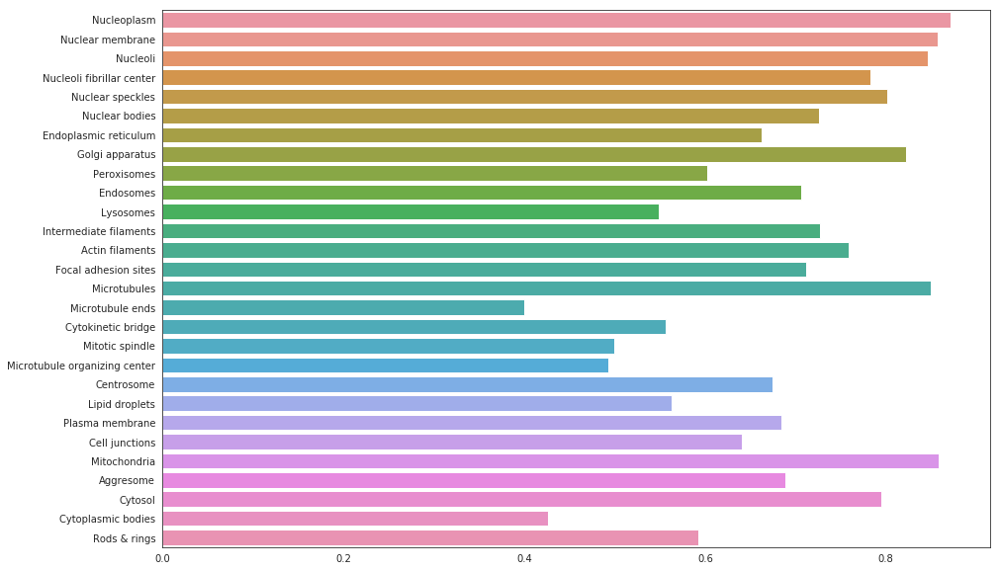

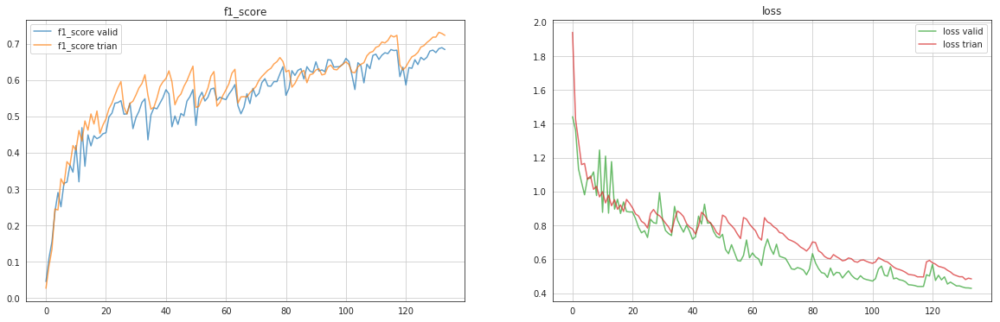

Overlapped keys: 320


100%|██████████| 19074/19074 [34:13<00:00,  9.29it/s]


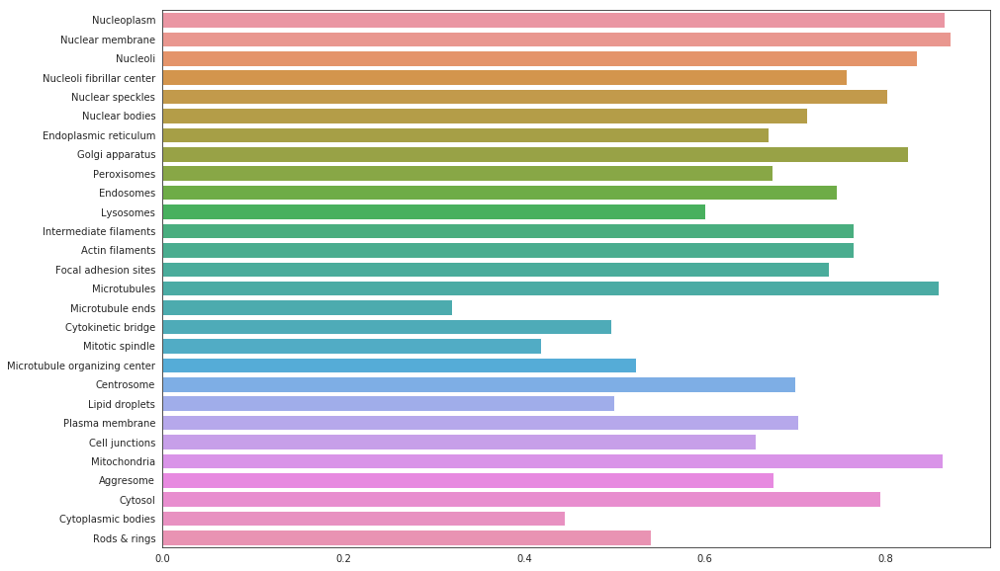

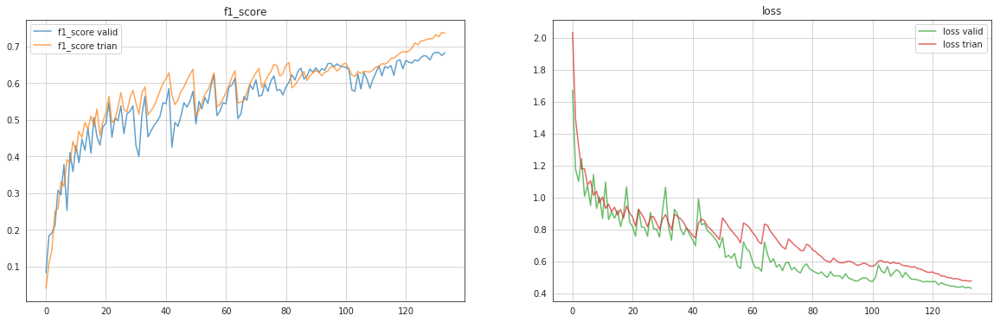

Overlapped keys: 320


100%|██████████| 19064/19064 [34:10<00:00,  9.30it/s]


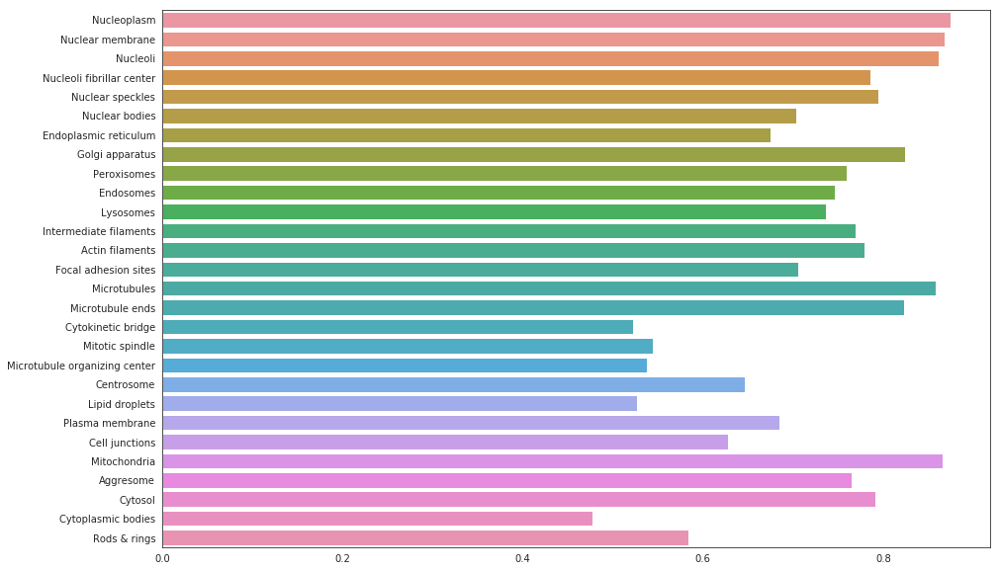

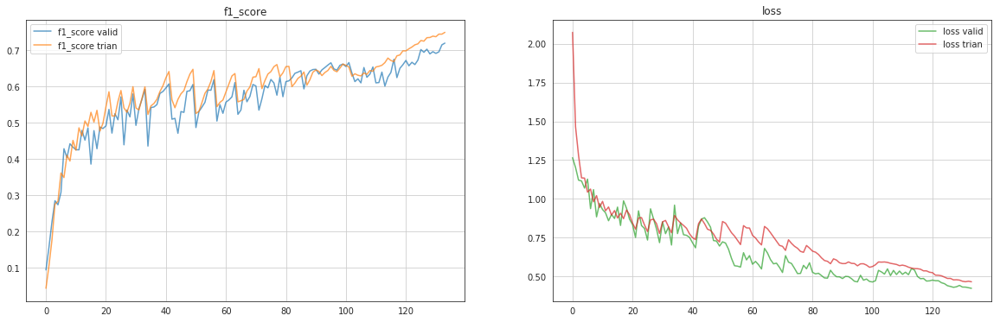

Overlapped keys: 320


 87%|████████▋ | 10207/11702 [17:55<02:37,  9.49it/s]

In [ ]:
for fold in range(3): #config.PARAMS['NB_FOLDS']):
    orchestrate_inference(fold, checkpoints_pth, epoch, fake_fc=False)

In [34]:
dump_path = os.path.join(checkpoints_pth, '{}_fold_{}')
template_path = 'fold_{}_checkpoint.epoch_{}'
path = os.path.join(checkpoints_pth, template_path)


valid_predicts = list()
valid_labels = list()
for fold in range(3): #config.PARAMS['NB_FOLDS']):
    valid_predicts.append(np.load(dump_path.format('valid_predicts', fold) + '.npy'))
    valid_labels.append(np.load(dump_path.format('valid_labels', fold) + '.npy'))
valid_predicts = np.concatenate(valid_predicts)
valid_labels = np.concatenate(valid_labels)


predicts = list()
for fold in range(3): #config.PARAMS['NB_FOLDS']):
    predicts.append(np.load(dump_path.format('test_predicts', fold) + '.npy'))
predicts = np.stack(predicts)


In [35]:
def get_threshold(roc_curve):
    vec = np.ones(shape=(2, ))
    vec /= np.linalg.norm(vec, ord=2)
    pts = vec.reshape(2, 1) * np.dot(vec, roc_curve[:2])
    distances = np.linalg.norm(roc_curve[:2] - pts, ord=2, axis=0)
    idx = np.argmax(distances)
    return roc_curve[-1, idx], idx

In [36]:
labels_ = valid_labels
preds_ = valid_predicts#.max(1)

# labels_ = history['valid_losses'][epoch]['labels'] # np.concatenate([stamp['labels'] for stamp in history['valid_losses']])
# preds_ = history['valid_losses'][epoch]['predictions'] # np.concatenate([stamp['predictions'] for stamp in history['valid_losses']])

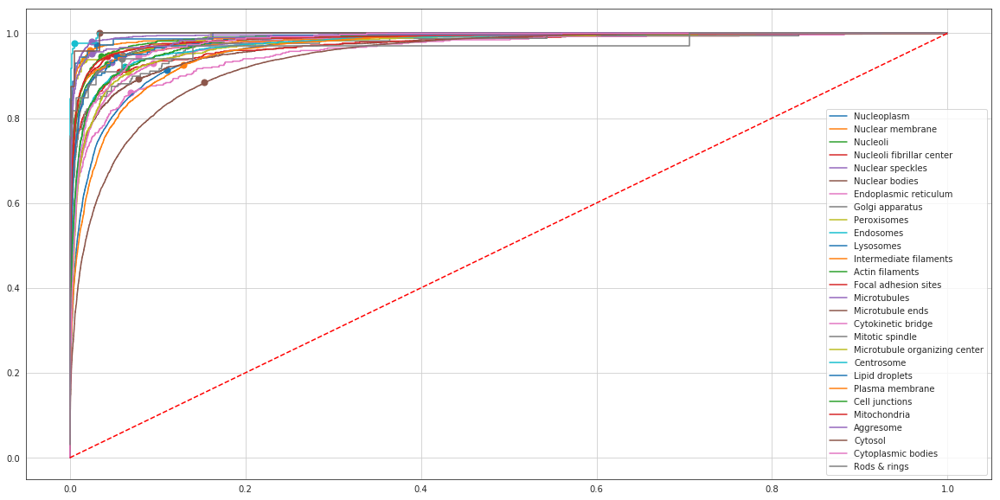

In [37]:
threshs = dict()
plt.figure(figsize=(20, 10))
for i in range(labels_.shape[-1]):
    roc_curve = sklearn.metrics.roc_curve(labels_[:, i], preds_[:, i])
    roc_curve = np.array(roc_curve)
    threshs[i], idx = get_threshold(roc_curve)
    plt.plot(roc_curve[0], roc_curve[1], label=label_names[i])
    plt.scatter(roc_curve[0, idx], roc_curve[1, idx], marker='o', s=50)

plt.plot(np.linspace(0, 1, 10), np.linspace(0, 1, 10), 'r--')
plt.legend()
plt.grid()
plt.show()

threshs = np.array([threshs[i] for i, el in enumerate(label_names_list)])

/home/vessemer/anaconda3/envs/cxr/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


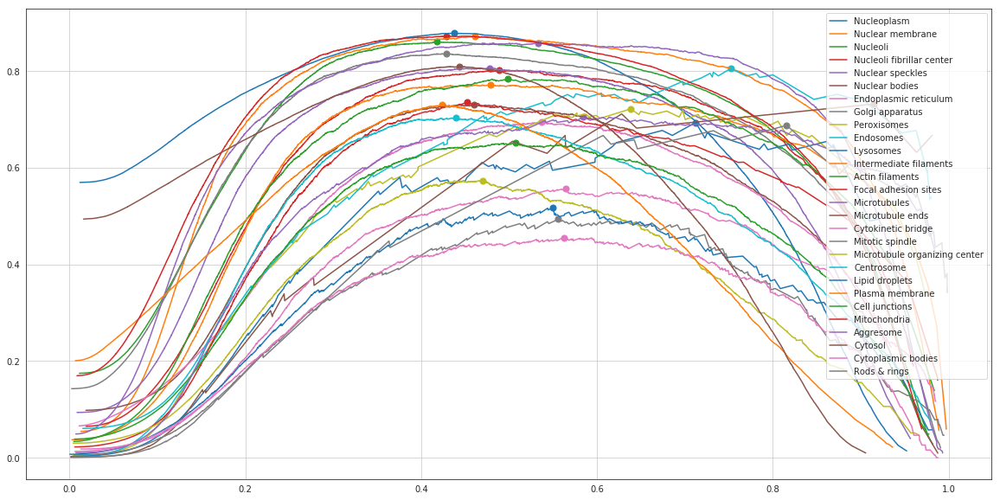

In [38]:
threshs = dict()
plt.figure(figsize=(20, 10))
for i in range(labels_.shape[-1]):
    roc_curve = sklearn.metrics.roc_curve(labels_[:, i], preds_[:, i])
    roc_curve = np.array(roc_curve)
    f1_scores = [sklearn.metrics.f1_score(labels_[:, i], preds_[:, i] >= t) for t in roc_curve[-1]]
    idx = np.argmax(f1_scores)
    threshs[i] = roc_curve[-1][idx]
    plt.plot(roc_curve[-1][1:-1], f1_scores[1:-1], label=label_names[i])
    plt.scatter(roc_curve[-1, idx], f1_scores[idx], marker='o', s=50)

plt.legend()
plt.grid()
plt.show()

threshs = np.array([threshs[i] for i, el in enumerate(label_names_list)])

In [39]:
folds = ds.get_folds(config.PARAMS['NB_FOLDS'])
_, valid_dataset = ds.get_datasets(folds, fold)

test_dataset = ds.ProteinDataset(
    test_df, 
    config.PATHS['TEST'], 
    config.label_names_list, 
    augmentations=None
)

In [40]:
history = pickle.load(open(path.format(fold, 'loss'), 'rb'))

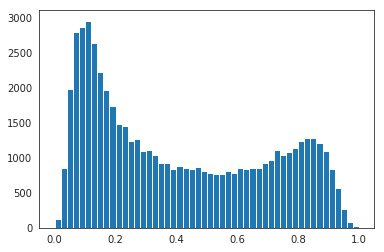

In [41]:
plt.hist(preds_[:, 0], 50);

In [42]:
np.mean(measure_f1(preds_, labels_, threshs=.5))

0.703747875343567

In [43]:
np.mean(measure_f1(preds_, labels_, threshs=threshs))

0.7225963397591774

In [44]:
np.save(os.path.join(checkpoints_pth, 'threshs.npy'), threshs)
threshs

array([0.43751547, 0.46144938, 0.41801596, 0.48899347, 0.47775942,
       0.46028653, 0.53658128, 0.42831355, 0.63836575, 0.75210071,
       0.71227133, 0.47834131, 0.49827826, 0.45182326, 0.53309977,
       0.91461802, 0.56434739, 0.55584776, 0.47033381, 0.4398973 ,
       0.54986316, 0.42395955, 0.50735623, 0.42815304, 0.5840075 ,
       0.44322395, 0.5619989 , 0.81577075])

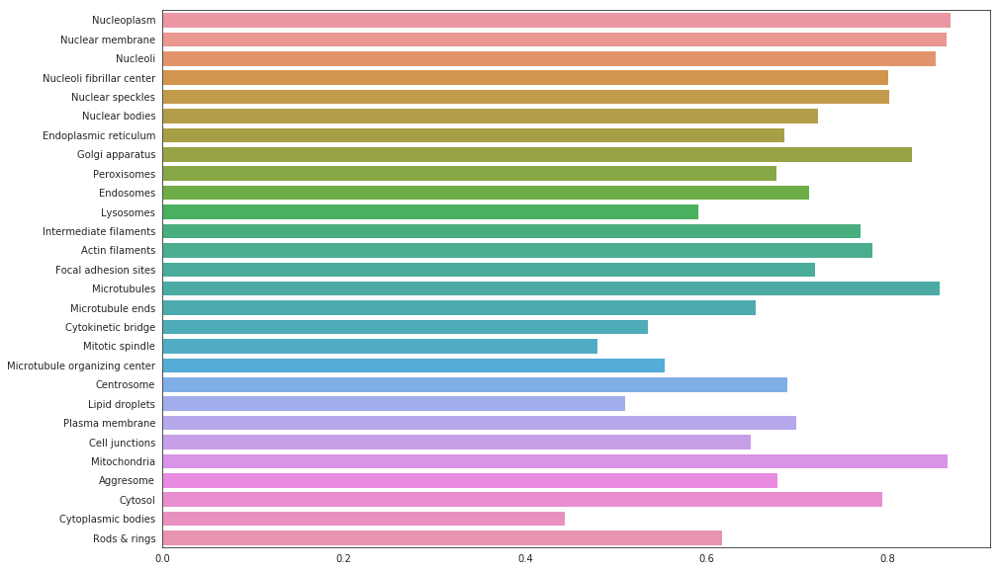

In [45]:
plt.figure(figsize=(15,10))
sns.barplot(y=config.label_names_list, x=measure_f1(preds_, labels_));
plt.show()

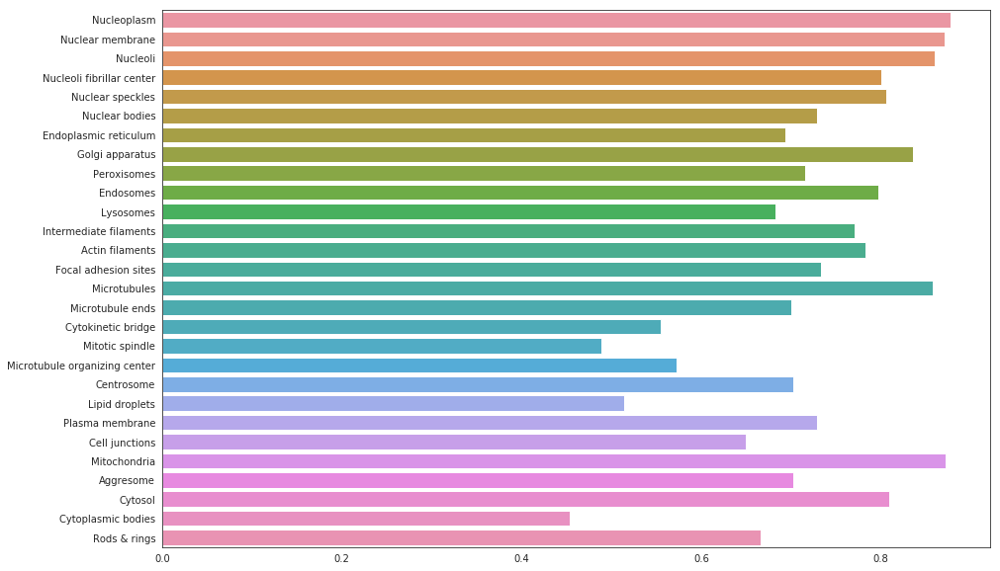

In [46]:
plt.figure(figsize=(15,10))
sns.barplot(y=config.label_names_list, x=measure_f1(preds_, labels_, threshs=threshs));
plt.show()

In [47]:
predicts.shape

(3, 11702, 28)

In [67]:
predicts.shape[1]

11702

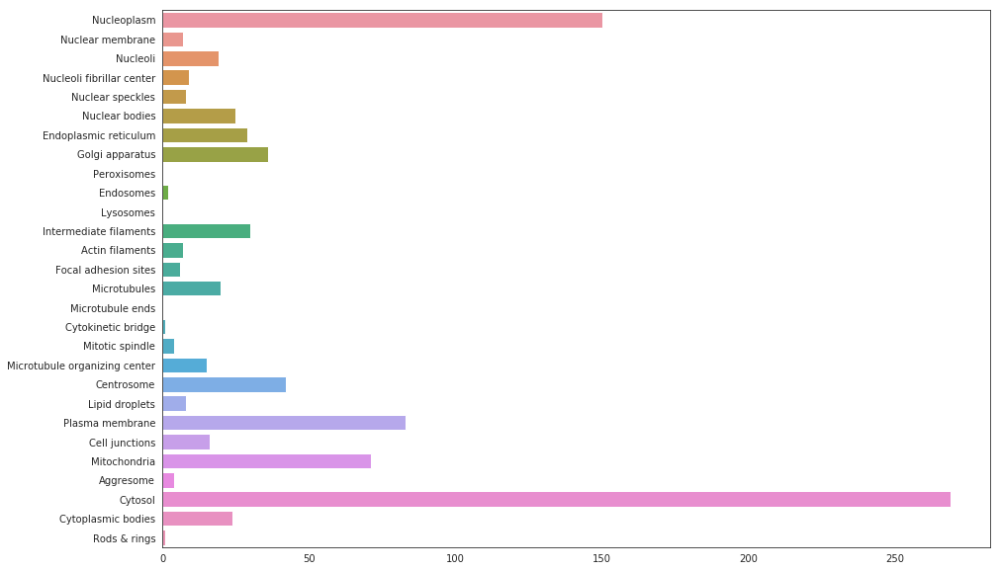

In [68]:
threshold = threshs # .5
# predictions = predicts.max(0) # format_predictions(results)['predictions']
predictions = np.power(np.product(predicts, axis=0), 1 / predicts.shape[0])


selected = predictions > threshold
idxs_mask = ~np.any(selected, axis=1)
best_outs = np.argmax(predictions[idxs_mask] - threshs, axis=1)
selected[idxs_mask, best_outs] = True
counts = np.zeros(shape=(len(config.label_names_list, )))
counts[:max(best_outs) + 1] = np.bincount(best_outs)

plt.figure(figsize=(15, 10))
sns.barplot(y=config.label_names_list, x=counts);
plt.show()

idxs = np.array(np.where(selected))
groups = npi.group_by(idxs[0]).split(idxs[1])

In [69]:
selected = (predictions > threshs).sum(1)
idxs_ = np.where(selected)
keys = pd.read_csv(dump_path.format('test_keys', fold), header=None)

ids_ = pd.DataFrame(keys[1].values[idxs_], columns=['Id'])
values = pd.DataFrame(predictions[idxs_] > threshs, columns=config.label_names_list)

labels = np.where(values[config.label_names_list].values)
labels = npi.group_by(labels[0]).split(labels[1])
labels = pd.DataFrame(pd.Series([' '.join([str(l) for l in sample]) for sample in labels]), columns=['Target'])

df = pd.concat([ids_, labels, values], axis=1)
df[config.label_names_list] = df[config.label_names_list].astype(np.int)

df.to_csv(os.path.join(config.PATHS['CSV'], 'pseudolabels_new.csv'), index=False)

In [70]:
df.head()

,Id,Target,Nucleoplasm,Nuclear membrane,Nucleoli,Nucleoli fibrillar center,Nuclear speckles,Nuclear bodies,Endoplasmic reticulum,Golgi apparatus,...,Microtubule organizing center,Centrosome,Lipid droplets,Plasma membrane,Cell junctions,Mitochondria,Aggresome,Cytosol,Cytoplasmic bodies,Rods & rings
0,00008af0-bad0-11e8-b2b8-ac1f6b6435d0,2,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0000a892-bacf-11e8-b2b8-ac1f6b6435d0,5,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0006faa6-bac7-11e8-b2b7-ac1f6b6435d0,0 5 25,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0008baca-bad7-11e8-b2b9-ac1f6b6435d0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,00109f6a-bac8-11e8-b2b7-ac1f6b6435d0,4,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [71]:
for idx, el in tqdm(zip(np.unique(idxs[0]), groups)):
    # test_datagen.dataset.labels.loc[idx, [label_names[e] for e in el]] = predictions[idx, el]
    test_dataset.labels.loc[idx, 'Predicted'] = ' '.join(['%d' % e for e in el])

11702it [00:12, 938.99it/s]


In [72]:
test_dataset.labels['Id'] = test_dataset.labels.index
df = test_dataset.labels[['Id', 'Predicted']]
df.to_csv('simple.csv', index=False)

In [53]:
df[df.Predicted.isna()].shape

(0, 2)

In [56]:
test_dataset.labels.index

RangeIndex(start=0, stop=11702, step=1)

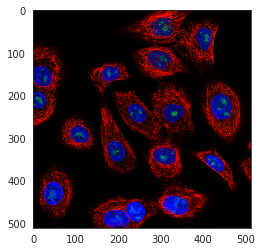

In [53]:
plt.imshow(cv2.imread('../data/test_shrinked/00008af0-bad0-11e8-b2b8-ac1f6b6435d0_blue_red_green.png'))